# A2Z Insurance

# 0. Problem Overview

# 1. Imports and Functions

In [1]:
import pandas as pd
import numpy as np

from math import ceil
from scipy.stats import chi2_contingency
from collections import Counter

from sklearn.preprocessing import MinMaxScaler, StandardScaler,RobustScaler, OneHotEncoder
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE


from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import AgglomerativeClustering,KMeans,estimate_bandwidth,MeanShift,DBSCAN
from kmodes.kprototypes import KPrototypes
from sklearn.mixture import GaussianMixture
from scipy.cluster.hierarchy import dendrogram

from sklearn.metrics import pairwise_distances,silhouette_score, silhouette_samples

import matplotlib.pyplot as plt
from matplotlib import cm, colorbar
from matplotlib.patches import RegularPolygon
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import colors as mpl_colors
from matplotlib.lines import Line2D
from matplotlib import __version__ as mplver
import matplotlib.font_manager
import seaborn as sns
plt.rcParams['font.family'] = 'DeJavu Serif'
plt.rcParams['font.serif'] = ['Times New Roman']

import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split

from collections import Counter

In [4]:
import graphviz

In [5]:
from umap import UMAP

### Functions

__hist_box_maker__ plots histograms and boxplots for the numeric features of a dataset.

In [6]:
def hist_box_maker(df,titl, figx, figy):
    num_of_rows = len(df.columns)
    fig, axes = plt.subplots(num_of_rows, ceil((len(df.columns)*2)/num_of_rows), figsize=(figx, figy))
    temp = (list(df.columns)*2)
    temp.sort()
    # Iterate across axes objects and associate each histogram:
    i = 0 
    for ax, feat in zip(axes.flatten(), temp):
        if i%2 == 0:
            ax.hist(df[feat], bins = 50)
            ax.set_title(feat,x=-0.3)
            pltiswork=feat
        else:
            sns.boxplot(x=df[pltiswork], ax = ax)
        i+=1    
    title = titl
    plt.suptitle(title,y=0.90)
    plt.show()

**cor_heatmap** plots headmap with correlation.

In [7]:
def cor_heatmap(cor):
    plt.figure(figsize=(12,10))
    sns.heatmap(data = cor, annot = True, cmap = plt.cm.PRGn, fmt='.1')

**pca_analysis** plots analysis of the principal components of a dataframe given.

In [8]:
def pca_analysis(dataframe):
    pca = PCA()
    pca_feat = pca.fit_transform(dataframe)
    pca_analysis = pd.DataFrame(
        {
         "PC": range(1, pca.n_components_ + 1),
         "Eigenvalue": pca.explained_variance_,
         "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
         "Proportion": pca.explained_variance_ratio_,
         "Cumulative": np.cumsum(pca.explained_variance_ratio_)}
    ).round(4)
    fig = plt.figure(figsize=(8,5))
    ax1 = fig.add_subplot(121)
    ax1.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
    ax1.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")
    ax1.legend()
    ax1.set(title='Variance Explained', xlabel='Components', ylabel='Proportion',\
            xticks= range(0, pca.n_components_, 1),xticklabels=range(1, pca.n_components_ + 1, 1))
    ax2 = fig.add_subplot(122)
    font_size=10
    bbox=[0, 0, 2, 1]
    ax2.axis('off')
    mpl_table = ax2.table(cellText = pca_analysis.values,colWidths=[1,2,2,2,2], bbox=bbox, colLabels=pca_analysis.columns)
    mpl_table.auto_set_font_size(False)
    mpl_table.set_fontsize(10)
    return pca_feat;

__get_r2_hc__ computes the R2 for a set of cluster solutions given by the application of a hierarchical method.

R2 is based on SSt = SSw + SSb and R2 = SSb/SSt. 

In [9]:
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable.

def get_r2_score(df,labels_name):
    df_temp=df.copy();
    df_temp.drop(labels_name,axis=1,inplace=True);
    
    sst = get_ss(df_temp)
    ssw = np.sum(df.groupby(by=labels_name).apply(get_ss))
    return 1 - ssw/sst;

def get_ss_var(df):
    ss = df.var() * (df.count() - 1)
    return ss  # return sum of sum of squares of each df variable.

def get_r2_variables(df, labels_name):
    df_temp=df.copy();
    df_temp.drop(labels_name,axis=1,inplace=True);
    
    sst = get_ss_var(df_temp)
    ssw_labels = np.sum(df.groupby(labels_name).apply(get_ss_var))
    return 1 - ssw_labels/sst

In [10]:
# Prepare input

def get_r2_hc(df, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    sst = get_ss(df)
    
    r2 = []  
    for i in range(min_nclus, max_nclus+1):
        cluster = AgglomerativeClustering(n_clusters=i, affinity=dist, linkage=link_method)
        hclabels = cluster.fit_predict(df) 
        df_concat = df.copy();
        df_concat['labels']=hclabels
        r2.append(get_r2_score(df_concat,'labels'))
        
    return np.array(r2)

def hierarchical_clustering_methods_nclust_analysis(dataframe,hc_methods, max_nclus):
    r2_hc_methods = np.vstack(
        [
            get_r2_hc(dataframe, link, max_nclus)
            for link in hc_methods
        ]
    ).T

    r2_hc_methods = pd.DataFrame(r2_hc_methods, index=range(1, max_nclus + 1), columns=hc_methods)

    sns.set()
    fig = plt.figure(figsize=(11,5))
    sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)
    fig.suptitle("R2 plot for various hierarchical methods", fontsize=21)
    plt.legend(title="HC methods", title_fontsize=11)
    plt.xticks(range(1, max_nclus + 1))
    plt.xlabel("Number of clusters", fontsize=13)
    plt.ylabel("R2 metric", fontsize=13)
    plt.show()

In [11]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

def plot_dendrogram(dataframe,y_threshold,linkage="ward",affinity='euclidean'):
    
    hclust = AgglomerativeClustering(linkage=linkage, affinity=affinity, distance_threshold=0, n_clusters=None)
    hclust.fit(dataframe)

    counts = np.zeros(hclust.children_.shape[0])
    n_samples = len(hclust.labels_)

    # hclust.children_ contains the observation ids that are being merged together
    # At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
    for i, merge in enumerate(hclust.children_):
        current_count = 0
        for child_idx in merge:
            # If child_idx < n_samples, then we are merging an observation
            # Otherwise,previously formed cluster is merged
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count
    
    linkage_matrix = np.column_stack(
        [hclust.children_, hclust.distances_, counts]
    ).astype(float)

    # Plot the corresponding dendrogram
    sns.set()
    fig = plt.figure(figsize=(11,5))
    # The Dendrogram parameters need to be tuned
    dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
    plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
    plt.title(f'Hierarchical Clustering - '+linkage+' | Dendrogram', fontsize=21)
    plt.xlabel('Number of points in node (or index of point if no parenthesis)')
    plt.ylabel(affinity+' Distance', fontsize=13)
    plt.show()

In [12]:
def plot_inertia_silhouette_scores(dataframe,min_clust,max_clust):
    range_clusters = range(min_clust, max_clust)

    inertia = []
    avg_silhouette=[]
    for n_clus in range_clusters:  # iterate over desired ncluster range
        kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
        cluster_labels = kmclust.fit_predict(dataframe)
        inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solut
        silhouette_avg = silhouette_score(dataframe, cluster_labels)
        avg_silhouette.append(silhouette_avg)

    f, (ax1, ax2) = plt.subplots(1, 2)
    f.set_size_inches(18.5, 8)
    ax1.plot(inertia)
    ax1.set_title('Inertia plot over clusters')
    ax1.set_ylabel("Inertia: SSw")
    ax1.set_xlabel("Number of clusters")
    ax1.set_xticks(np.arange(len(range_clusters)),np.arange(2, max(range_clusters)+1, 1))
    
    ax2.plot(avg_silhouette)
    ax2.set_title('Average silhouette plot over clusters')
    ax2.set_ylabel("Average silhouette")
    ax2.set_xlabel("Number of clusters")
    ax2.set_xticks(np.arange(len(range_clusters)),np.arange(2, max(range_clusters)+1, 1))
    
    plt.show()

In [13]:
def plot_component_planes(weights,features, M=3, N=4, figsize=(20,20),figlayout=(3,4),title="Component Planes",cmap=cm.magma):
    xx, yy = np.meshgrid(np.arange(N), np.arange(M))
    xx = xx.astype(float)
    yy = yy.astype(float)
    xx[::-2] -= 0.5
    xx = xx
    yy = yy
    weights_ = np.flipud(np.flip(weights.reshape((M,N,len(features))),axis=1))
    fig = plt.figure(figsize=figsize, constrained_layout=True)
    subfigs = fig.subfigures(figlayout[0], figlayout[1], wspace=.15)
    ## Normalize color scale to range of all values
    colornorm = mpl_colors.Normalize(vmin=np.min(weights),vmax=np.max(weights))
    for cpi, sf in zip(range(len(features)), subfigs.flatten()):
        sf.suptitle(features[cpi], y=0.95, fontsize=14)
        axs = sf.subplots(1,1, )
        axs.set_aspect('equal')
        ## Normalize color scale to range of values in each component
        colornorm = mpl_colors.Normalize(vmin=np.min(weights_[:,:,cpi]), 
                                         vmax=np.max(weights_[:,:,cpi]))
        # iteratively add hexagons
        for i in range(weights_.shape[0]):
            for j in range(weights_.shape[1]):
                wy = yy[(i, j)] * np.sqrt(3) / 2
                hexagon = RegularPolygon((xx[(i, j)], wy), numVertices=6, radius=.99 / np.sqrt(3),
                                     facecolor=cmap(colornorm(weights_[i, j, cpi])), alpha=1, linewidth=.5,
                                     edgecolor=cmap(colornorm(weights_[i, j, cpi])))
                axs.add_patch(hexagon)
        ## only run this block if matplotlib >= 3.6.x
        mplv = [int(i) for i in mplver.split('.')]
        if mplv[1] >= 6:
            ## Add colorbar
            divider = make_axes_locatable(axs)
            ax_cb = divider.append_axes("right", size="7%")#, pad="2%")
            ## Create a Mappable object
            cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
            cmap_sm.set_array([])
            ## Create custom colorbar 
            cb1 = colorbar.Colorbar(ax_cb,orientation='vertical',alpha=1,mappable=cmap_sm)
            #cb1.ax.get_yaxis().labelpad = 16
            ## Add colorbar to plot
            sf.add_axes(ax_cb)
        ## Remove axes for hex plot
        axs.margins(.05)
        axs.axis("off")
    fig.suptitle(title, fontsize=16)
    plt.show()

In [14]:
def plot_models_r2_nclust(models_dict,lower_lim):
    scores=[];
    n_clusters=[];
    for modelName,modelDataframe in models_dict.items():
        scores.append(get_r2_score(modelDataframe,'labels'))
        n_clusters.append(len(np.unique(modelDataframe['labels'])))
        
    sns.set()
    f, (ax1,ax2) = plt.subplots(1, 2)
    f.set_size_inches(18.5, 12.5)
    
    x = np.arange(len(scores))  # the label locations
    
    width = 0.20  # the width of the bars
    ax1.set_facecolor("white")
    ax1.bar(x - width/2, scores, width, color="#4A7A89")
    ax1.set_ylim(lower_lim,1.0)
    ax1.set_ylabel('Scores',fontsize=14)
    ax1.set_title('R-Squared score by Model',fontsize=16)
    ax1.set_xticks(x, models_dict.keys(),fontsize=14)
    
    ax2.set_facecolor("white")
    ax2.bar(x - width/2, n_clusters, width, color="#4A7A89")
    ax2.set_ylabel('Scores',fontsize=14)
    ax2.set_title('Number of Clusters by Model',fontsize=16)
    ax2.set_xticks(x, models_dict.keys(),fontsize=14)
    plt.show()

In [136]:
def plot_2dClusters(df_reduced,models_dict): 
    f, ax = plt.subplots(2, 3, sharey=True)
    f.set_size_inches(18.5, 12.5)
    f.set
    j=0;
    i=0;
    xlabel=df_reduced.columns[0]
    ylabel=df_reduced.columns[1]
    for modelName,modelDataframe in models_dict.items():
        labels=modelDataframe['labels']
        if(j==3):
            i+=1;
            j=0;
        ax[i][j].set_title(modelName, fontsize = 15)
        ax[i][j].set_xlabel(xlabel, fontsize = 15)
        ax[i][j].set_ylabel(ylabel, fontsize = 15)
        ax[i][j].scatter(df_reduced.iloc[:,0],df_reduced.iloc[:,1], c = labels, cmap='tab20',s=2)
        j+=1;
    plt.show()




# 2. Data Importing

In [16]:
df_original = pd.read_sas("a2z_insurance.sas7bdat")

Checking how many rows and columns are in the dataset

In [17]:
print('The dataset has', df_original.shape[0], 'rows, and', df_original.shape[1], 'columns')

The dataset has 10296 rows, and 14 columns


# 3. Data Exploration and Analysis

### 3.1. Data Overview

In [18]:
df_original.head(2)

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13


The data is copied from df_original to a new DataFrame to maintain the original version unchanged.

In [19]:
df = df_original.copy()

Defining ___CustID___ as index of the DataFrame.

In [20]:
df.set_index('CustID',inplace=True)

The empty cells are replaced by nan for further better analysis.

In [21]:
df.replace("",np.nan,inplace=True)

**Checking for data types**

In [22]:
df.dtypes

FirstPolYear     float64
BirthYear        float64
EducDeg           object
MonthSal         float64
GeoLivArea       float64
Children         float64
CustMonVal       float64
ClaimsRate       float64
PremMotor        float64
PremHousehold    float64
PremHealth       float64
PremLife         float64
PremWork         float64
dtype: object

**Checking for missing values**

In [23]:
df.isna().sum()

FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

Most variables have missing values. Those NaNs are fixed on **Feature Engineering**.

**Checking for duplicated values**

In [24]:
df.duplicated().sum()

3

**Generate descriptive statistics**

In [25]:
df.describe(include ='all').transpose()

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
FirstPolYear,10266.0,NaN,NaN,NaN,1991.062634,511.267913,1974.0,1980.0,1986.0,1992.0,53784.0
BirthYear,10279.0,NaN,NaN,NaN,1968.007783,19.709476,1028.0,1953.0,1968.0,1983.0,2001.0
EducDeg,10279,4,b'3 - BSc/MSc',4799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10260.0,NaN,NaN,NaN,2506.667057,1157.449634,333.0,1706.0,2501.5,3290.25,55215.0
GeoLivArea,10295.0,NaN,NaN,NaN,2.709859,1.266291,1.0,1.0,3.0,4.0,4.0
Children,10275.0,NaN,NaN,NaN,0.706764,0.455268,0.0,0.0,1.0,1.0,1.0
CustMonVal,10296.0,NaN,NaN,NaN,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,NaN,NaN,NaN,0.742772,2.916964,0.0,0.39,0.72,0.98,256.2
PremMotor,10262.0,NaN,NaN,NaN,300.470252,211.914997,-4.11,190.59,298.61,408.3,11604.42
PremHousehold,10296.0,NaN,NaN,NaN,210.431192,352.595984,-75.0,49.45,132.8,290.05,25048.8


**Analysis of the describe method:**
- FirstPolYear, MonthSal and ClaimsRate seem to have outliers on the higher side.
- CustMonVal seems to have outlier on the lower and higher side.
- PremHouseHold, PremMotor, PremHealth, PremLife and PremWork seem also to have outliers on the higher side.
- BirthYear seem to have outliers on the lower side.

After lthe data overview, we noticed we have to have to do some data preparation and pre processing, mainly due to incoherent data, outliers and missing values before any analysis can take place.

### 3.2. Visual Exploration

**Defining metric and non-metric features**

In [26]:
non_metric_features = ["EducDeg", "GeoLivArea", "Children"]
metric_features = df.columns.drop(non_metric_features).to_list()

### Analysis of numerical data

**Pairwise relationship of metric variables**

In [27]:
##sns.set()

# Setting pairgrid
##g = sns.PairGrid(df[metric_features].dropna())

# Populating pairgrid
#mdg = g.map_diag(plt.hist, edgecolor="w")
#mog = g.map_offdiag(plt.scatter, edgecolor="w", s=40)
    
# Layout
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise relationship of metric variables", fontsize=30)

#plt.show()

**Outlier detection with histogram and boxplot visualization**

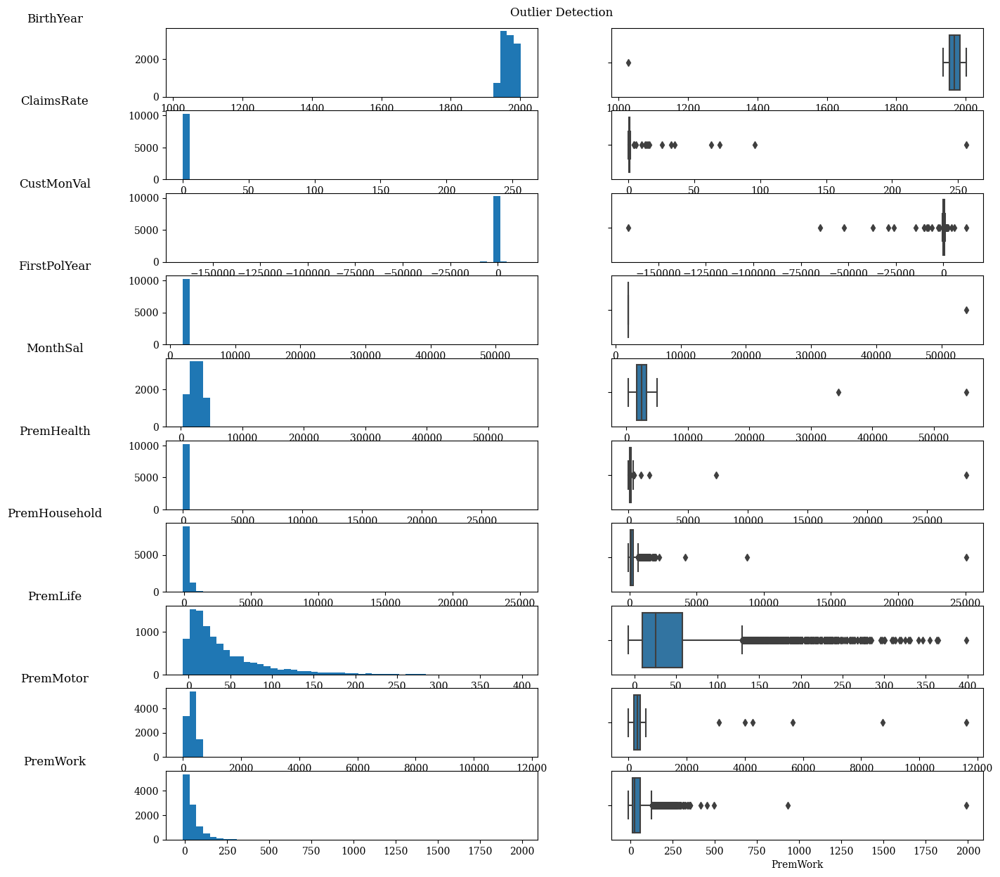

In [29]:
hist_box_maker(df[metric_features],"Outlier Detection",15,15)

**Correlation Matrix**

locator: <matplotlib.ticker.AutoLocator object at 0x000001ECF632D790>


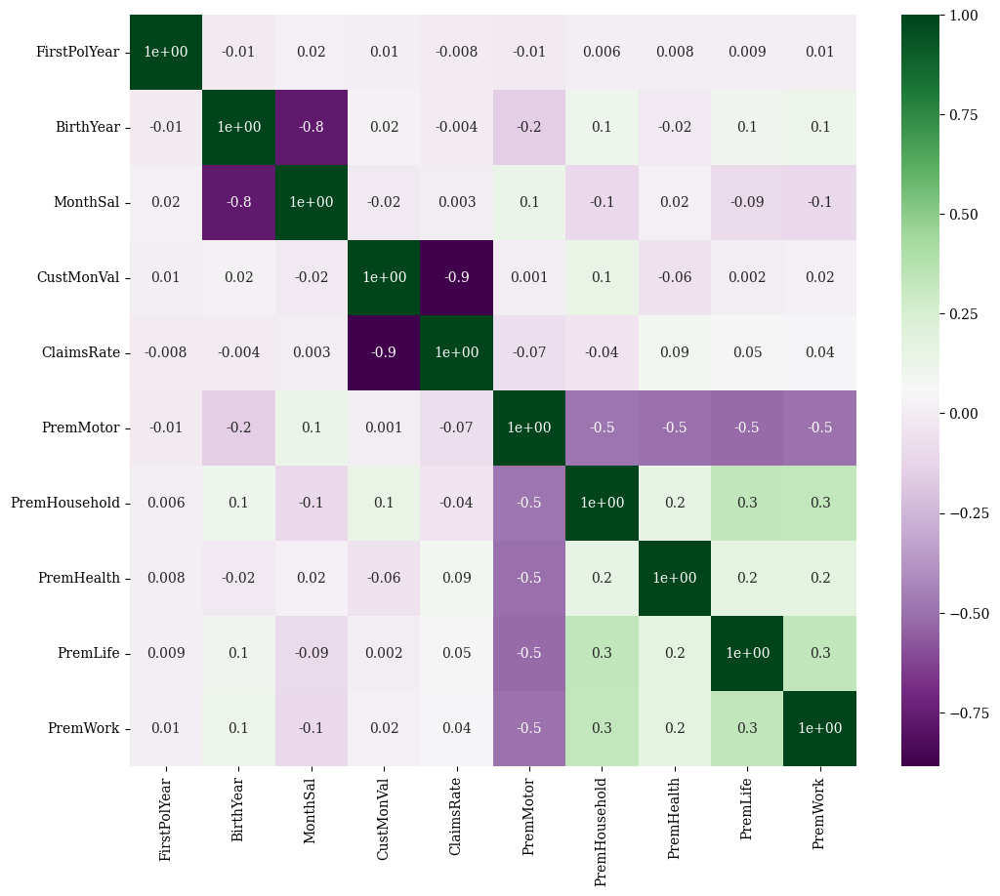

In [31]:
cor_heatmap(df[metric_features].corr(method='kendall'))

### Analysis of categorical data

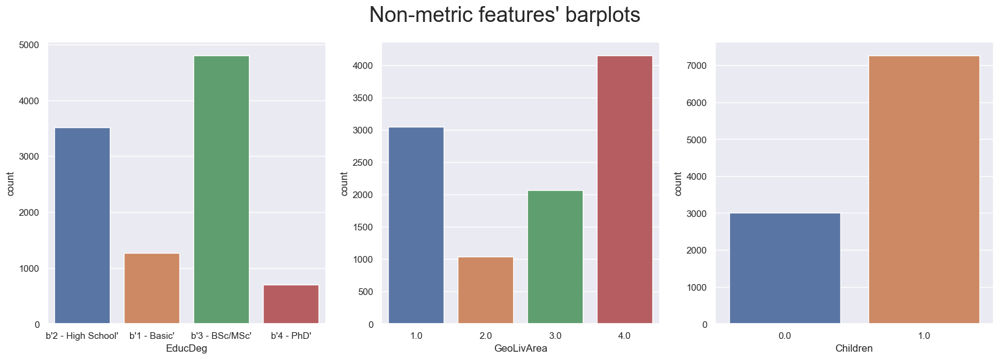

In [33]:
sns.set()

fig, axes = plt.subplots(ceil(len(df[non_metric_features].columns)/3), 3, figsize=(20, 6))
plt.subplots_adjust(hspace = 0.18)

# Plot data
for ax, feat in zip(axes.flatten(), df[non_metric_features].columns):
    sns.countplot(x=df[feat], ax=ax)
     
plt.suptitle("Non-metric features' barplots", fontsize=25)# Title

plt.show()

There is no need to perform a coherence check on our categorical variables.

# 4. Data Pre-processing

In [34]:
df_processed = df.copy()

## 4.1 Removing duplicates

In [35]:
df_processed = df_processed.drop_duplicates()

In [36]:
df_processed.shape # 3 duplicated rows were eliminated

(10293, 13)

## 4.2. Treating Missing Values

Regarding the missing values, we separate the process in three steps:
1. Fill all NaN values from Prem columns with **0**;
2. Remove rows with more than 1 missing value, ___if they're a small quantity___;
3. Fill other features's NaNs with **KNNImputer** for metric features and **Mode** for non metric features.

***NaN values from the 'Prem' columns are filled with 0***

In [37]:
prem_features = df_processed.columns[df_processed.columns.str.startswith('Prem')].tolist()
df_processed[prem_features] = df_processed[prem_features].fillna(value=0)

***Checking for rows with more than 1 NaN values.***

In [38]:
moreThan1NaNDataFrame=df_processed.loc[df_processed.isna().sum(axis=1) >= 2]
moreThan1NaNDataFrame.shape

(29, 13)

Since it's only 29 rows, we drop them.

In [39]:
df_processed.drop(index=moreThan1NaNDataFrame.index,inplace=True)

##### KNNImputer method

In [40]:
# Creating new df copy to explore neighbordhood imputation
df_neighbors = df_processed.copy()

In [41]:
# Checking rows with NaNs
nans_rows = df_neighbors.isna().any(axis=1)
df_neighbors[nans_rows].head(5)

,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
CustID,,,,,,,,,,,,,
22.0,1977.0,1958.0,b'2 - High School',NaN,3.0,1.0,111.37,0.80,407.52,111.70,100.13,24.67,30.34
144.0,1996.0,1990.0,b'3 - BSc/MSc',NaN,4.0,1.0,-42.45,1.02,146.36,353.95,220.04,121.80,42.01
420.0,1987.0,NaN,b'2 - High School',3219.0,1.0,1.0,379.30,0.33,404.52,42.80,152.25,7.78,-0.11
489.0,1977.0,1947.0,b'3 - BSc/MSc',NaN,3.0,0.0,-52.56,1.09,0.00,0.00,278.83,0.00,27.56
540.0,1979.0,1992.0,b'2 - High School',NaN,2.0,1.0,85.13,0.79,156.25,0.00,237.71,12.89,110.13


In [42]:
# KNNImputer 
imputer = KNNImputer(n_neighbors=10, weights="uniform")
df_neighbors[metric_features] = imputer.fit_transform(df_neighbors[metric_features])

Since KNNImputer method only works for numerical variables, and we have missing values on categorical variables as well, modes are used to fill them.

##### Modes Method

In [43]:
modes = df_neighbors[non_metric_features].mode().loc[0]
pd.DataFrame(modes)

,0
EducDeg,b'3 - BSc/MSc'
GeoLivArea,4.0
Children,1.0


In [44]:
#Filling all NaNs with modes
df_neighbors.fillna(modes,inplace=True)
df_processed = df_neighbors.copy()

## 4.3. Coherence Checks

**Fixing FirstPolYear and BirthYear Inconsistencies.**

Since there are a lot of data where the first year as a client (FirstPolYear) is lower than the Birth Year, we suppose they are filling errors from the customers. The values from the rows where that happens are switched.

In [45]:
datasetFillingError=df_processed.loc[df_processed['FirstPolYear']<df_processed['BirthYear']]
print('There are',datasetFillingError.shape[0],'filling errors on the dataset.')

There are 1999 filling errors on the dataset.


In [46]:
indexes = datasetFillingError.index.to_list()
firstPolYearErrors = datasetFillingError['FirstPolYear'].to_list()
birthYearErrors = datasetFillingError['BirthYear'].to_list()

df_processed.loc[indexes,'FirstPolYear'] = birthYearErrors
df_processed.loc[indexes,'BirthYear'] = firstPolYearErrors

The other metric features in the dataset dont seem to have contextual incoherences.

## 4.4. Outliers

**Global Outliers are removed and Contextual outliers are analysed.**

### Global Outliers

In [47]:
filters_global = (
    (df_processed['FirstPolYear']<=2016)# more than the existing year is deleted
    &
    (df_processed['BirthYear']>1930)# more than 86 years are removed from the database
    &
    (df_processed['MonthSal']> 0))# negative salary is removed
"""
    &
    #https://www.marketwatch.com/picks/guides/insurance/most-expensive-car-insurance/
    (df_processed['PremMotor']< 7000)
    &
    #https://www.teamais.net/blog/how-much-does-it-cost-to-insure-a-luxury-home/
    (df_processed['PremHousehold']< 10000)
    &
    #https://www.forbes.com/advisor/health-insurance/most-and-least-expensive-states-for-health-care-ranked/
    (df_processed['PremHealth']<= 385) & (df_processed['PremHealth']>-50)
    &
    #https://life.futuregenerali.in/life-insurance-made-simple/life-insurance/what-are-the-5-largest-insurance-covers-ever-sold/
    #(df_processed['PremLife']< None)  No maximum exists
    &
    (df_processed['PremWork']<= 127) & (df_processed['PremWork']>= -20)

)
"""
df_processed = df_processed[filters_global].copy()

### Contextual Outliers

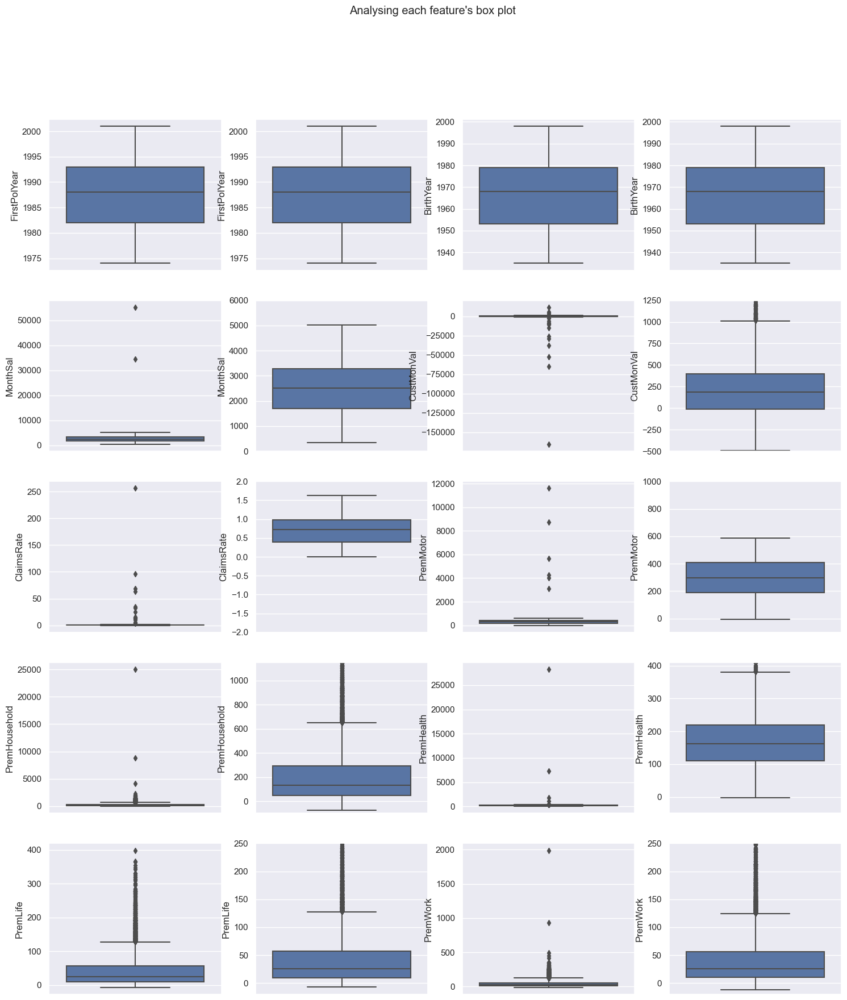

In [51]:
fig, axes = plt.subplots(5, 4, figsize=(18, 20))

fig.suptitle("Analysing each feature's box plot")

sns.boxplot(ax=axes[0, 0],y=df_processed["FirstPolYear"])
sns.boxplot(ax=axes[0, 1],y=df_processed["FirstPolYear"])

sns.boxplot(ax=axes[0, 2],y=df_processed["BirthYear"])
sns.boxplot(ax=axes[0, 3],y=df_processed["BirthYear"])

sns.boxplot(ax=axes[1, 0],y=df_processed["MonthSal"])
sns.boxplot(ax=axes[1, 1],y=df_processed["MonthSal"])
axes[1, 1].set_ylim(0, 6000)

sns.boxplot(ax=axes[1, 2],y=df_processed["CustMonVal"])
sns.boxplot(ax=axes[1, 3],y=df_processed["CustMonVal"])
axes[1, 3].set_ylim(-500, 1250)

sns.boxplot(ax=axes[2, 0],y=df_processed["ClaimsRate"])
sns.boxplot(ax=axes[2, 1],y=df_processed["ClaimsRate"])
axes[2, 1].set_ylim(-2, 2)

sns.boxplot(ax=axes[2, 2],y=df_processed["PremMotor"])
sns.boxplot(ax=axes[2, 3],y=df_processed["PremMotor"])
axes[2, 3].set_ylim(-100, 1000)

sns.boxplot(ax=axes[3, 0],y=df_processed["PremHousehold"])
sns.boxplot(ax=axes[3, 1],y=df_processed["PremHousehold"])
axes[3, 1].set_ylim(-100, 1150)

sns.boxplot(ax=axes[3, 2],y=df_processed["PremHealth"])
sns.boxplot(ax=axes[3, 3],y=df_processed["PremHealth"])
axes[3, 3].set_ylim(-50, 410)

sns.boxplot(ax=axes[4, 0],y=df_processed["PremLife"])
sns.boxplot(ax=axes[4, 1],y=df_processed["PremLife"])
axes[4, 1].set_ylim(-20,250)

sns.boxplot(ax=axes[4, 2],y=df_processed["PremWork"])
sns.boxplot(ax=axes[4, 3],y=df_processed["PremWork"])
axes[4, 3].set_ylim(-20, 250)


plt.show()

In [49]:
filters1 = (
    (df_processed['FirstPolYear']<2016) & (df_processed['FirstPolYear']>1970) #Removing new clients from current year
    &
    (df_processed['BirthYear']>1930) & (df_processed['BirthYear']<2016)
    &
    (df_processed['MonthSal']<= 6000)
    &
    ((df_processed['CustMonVal']<=1250) & (df_processed['CustMonVal']>=-1000)) 
    &
    (df_processed['ClaimsRate']<=2) & (df_processed['ClaimsRate']>=-5)
    &
    (df_processed['PremMotor']<= 1000) & (df_processed['PremMotor']> -100)
    &
    (df_processed['PremHousehold']<= 1150) & (df_processed['PremHousehold']> -100)
    &
    (df_processed['PremHealth']<= 410) & (df_processed['PremHealth']>-50)
    &
    (df_processed['PremLife']<= 250) & (df_processed['PremLife']>= -20)
    &
    (df_processed['PremWork']<= 250) & (df_processed['PremWork']>= -20)
)

In [50]:
print('Percentage of data kept after removing outliers:', np.round(df_processed[filters1].shape[0] / df_processed.shape[0], 4))

Percentage of data kept after removing outliers: 0.9808


**Through DBScan**

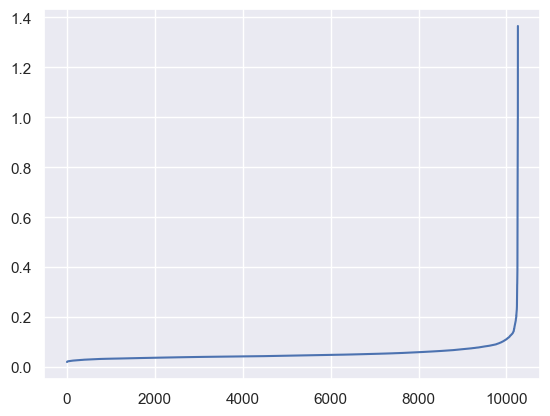

In [52]:
#normalizing data
df_dbscan = df_processed.copy()
scaler = MinMaxScaler()
df_dbscan[metric_features] = scaler.fit_transform(df_dbscan[metric_features])

# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=15)
neigh.fit(df_dbscan[metric_features])
distances, _ = neigh.kneighbors(df_dbscan[metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.grid(visible=True)
plt.show()

In [53]:
dbscan = DBSCAN(eps=0.11, min_samples=30, n_jobs=4)
df_dbscan['labels'] = dbscan.fit_predict(df_dbscan[metric_features])

dbscan_n_clusters = len(np.unique(df_dbscan['labels']))
print(str(Counter(df_dbscan['labels'])))

Counter({0: 10087, -1: 175})


In [54]:
filters2 = filters1 & (df_dbscan['labels']!=-1)

In [55]:
print('Percentage of data kept after removing outliers:', np.round(df_processed[filters2].shape[0] / df_processed.shape[0], 4))

Percentage of data kept after removing outliers: 0.9707


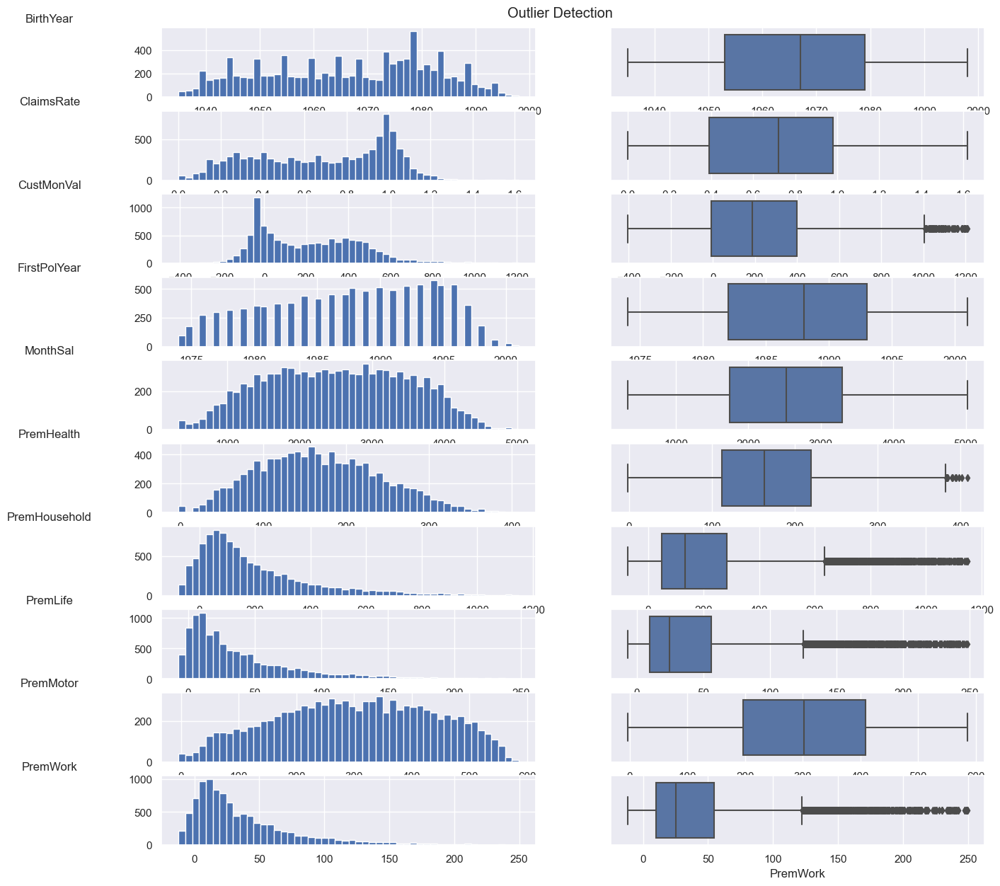

In [56]:
hist_box_maker((df_processed[filters1])[metric_features],"Outlier Detection",15,15)

## 4.5. Feature Engineering

**Churn Rate analysis**

Since there are no outliers in the lower side of the premiums, the churn rate can be directly calculated.

churn_rate= number of premiums with  or less than 0 / total number the customers

In [57]:
hasNoPremium = ((df_processed['PremMotor']==0) & (df_processed['PremHousehold']==0) & (df_processed['PremHealth']==0) &\
            (df_processed['PremLife']==0) &(df_processed['PremWork']==0))
print("The churn rate is " + str(round((sum(hasNoPremium)/df_processed.shape[0])*100,2))+"%.");

The churn rate is 0.12%.


In [58]:
df_processed= df_processed[~hasNoPremium]

Replacing __BirthYear__ by __Age__

In [59]:
df_processed['BirthYear'] = 2016 - df_processed['BirthYear']
df_processed.rename(columns={"BirthYear": "Age"},inplace =True)
metric_features.remove('BirthYear')
metric_features.append('Age')

Replacing __FirtstPolYear__ with the years that passed since the first year with insurance.

In [60]:
df_processed['FirstPolYear'] = 2016 - df_processed['FirstPolYear']
df_processed.rename(columns={"FirstPolYear": "time_as_customer"},inplace =True) #years passed since the first year
metric_features.remove('FirstPolYear')
metric_features.append('time_as_customer')

Replacing __MonthSal__ by **YearSal**

In [61]:
df_processed['MonthSal'] = df_processed['MonthSal']*14
df_processed.rename(columns={"MonthSal": "YearSal"},inplace =True) #years passed since the first year
metric_features.remove('MonthSal')
metric_features.append('YearSal')

**TotalPremiums** feature extraction

Records with TotalPremiums equal to 0 are removed since is not valuable for cluster analysis.

In [62]:
df_processed['TotalPremiums'] = np.sum(df_processed[prem_features],axis=1)
metric_features.append('TotalPremiums')

Mapping **Premium Features** to **Rates**.

In [63]:
prem_features_copy=prem_features.copy();
for each_prem in prem_features_copy:
    df_processed[each_prem] =np.round(df_processed[each_prem]/ df_processed['TotalPremiums'],3)
    df_processed.rename(columns={each_prem: each_prem+"Ratio"},inplace=True)
    metric_features.remove(each_prem)
    metric_features.append(each_prem+"Ratio")
    prem_features.remove(each_prem)
    prem_features.append(each_prem+"Ratio")

**Profit** feature extraction

Profits = Premiums -  AmountInsured

ProfitsOverPremiums = Profit/Premiums = **1 - InsuredRate**

In [64]:
df_processed['ProfitsRate'] = 1- df_processed['ClaimsRate']

metric_features.append('ProfitsRate')

**Cust Classification** feature extraction

Number of premiums the customer is linked to.

In [65]:
df_processed['cust_classification']= np.sum(df_processed[prem_features]!=0,axis=1)
non_metric_features.append('cust_classification')

In [66]:
df_processed.head(3)

,time_as_customer,Age,EducDeg,YearSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,TotalPremiums,ProfitsRate,cust_classification
CustID,,,,,,,,,,,,,,,,
1.0,31.0,34.0,b'2 - High School',30478.0,1.0,1.0,380.97,0.39,0.565,0.119,0.220,0.071,0.025,665.56,0.61,5
2.0,21.0,35.0,b'2 - High School',9478.0,4.0,1.0,-131.13,1.12,0.085,0.457,0.128,0.213,0.117,910.96,-0.12,5
3.0,25.0,46.0,b'1 - Basic',31878.0,3.0,0.0,504.67,0.28,0.278,0.303,0.168,0.117,0.134,740.60,0.72,5


### Mapping and One hot enconding

**Replacing ordinal categorical feature __EducDeg__ with numbers:**
- __1__ if __"b'1 - Basic'"__;
- __2__ if __"b'2 - High School'"__;
- __3__ if __"b'3 - BSc/MSc'"__;
- __4__ if __"b'4 - PhD'"__.

In [67]:
df_processed['EducDeg'].value_counts()

b'3 - BSc/MSc'        4785
b'2 - High School'    3502
b'1 - Basic'          1268
b'4 - PhD'             695
Name: EducDeg, dtype: int64

In [68]:
def mappingTransform (x):
    return int(str(x)[2]);

In [69]:
df_processed['EducDeg'] =df_processed['EducDeg'].map(mappingTransform)

Replacing __GeoLivArea__ with multiple columns by __OneHotEncoding__, since it's not an ordinal feature.

In [70]:
oneHotEncoder = OneHotEncoder(sparse=False, drop='first')
oh_feat = oneHotEncoder.fit_transform(df_processed[['GeoLivArea']])
oh_feat_names = oneHotEncoder.get_feature_names_out()
oh_df = pd.DataFrame(oh_feat, index=df_processed.index, columns=oh_feat_names)

df_processed = pd.concat([df_processed, oh_df], axis=1)
non_metric_features.extend(oh_df.columns)

In [71]:
df_outliers= df_processed[~filters2].copy()
df_processed = df_processed[filters2].copy()

C:\Users\Pedro\AppData\Local\Temp\ipykernel_11436\2275853091.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_outliers= df_processed[~filters2].copy()
C:\Users\Pedro\AppData\Local\Temp\ipykernel_11436\2275853091.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_processed = df_processed[filters2].copy()


In [72]:
df_processed.loc[df_processed['Age']<=18]

,time_as_customer,Age,EducDeg,YearSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,TotalPremiums,ProfitsRate,cust_classification,GeoLivArea_2.0,GeoLivArea_3.0,GeoLivArea_4.0
CustID,,,,,,,,,,,,,,,,,,,
4317.0,17.0,18.0,1,12264.0,2.0,1.0,102.47,0.88,0.125,0.552,0.144,0.065,0.113,1021.2,0.12,5,1.0,0.0,0.0


## 4.6 Feature Selection

In [73]:
df_feature_selection = df_processed.copy()

#### Filter Methods

- For the metric and ordinal features,**Kendall** is the method chosen to evaluate the correlation between the features.

- For the non metric features, box plots used to evaluate relationship between the independent and depend variables.

### 4.6.1. Kendall Correlation Between All Numerical and Ordinal Features

locator: <matplotlib.ticker.AutoLocator object at 0x000001ECF6560910>


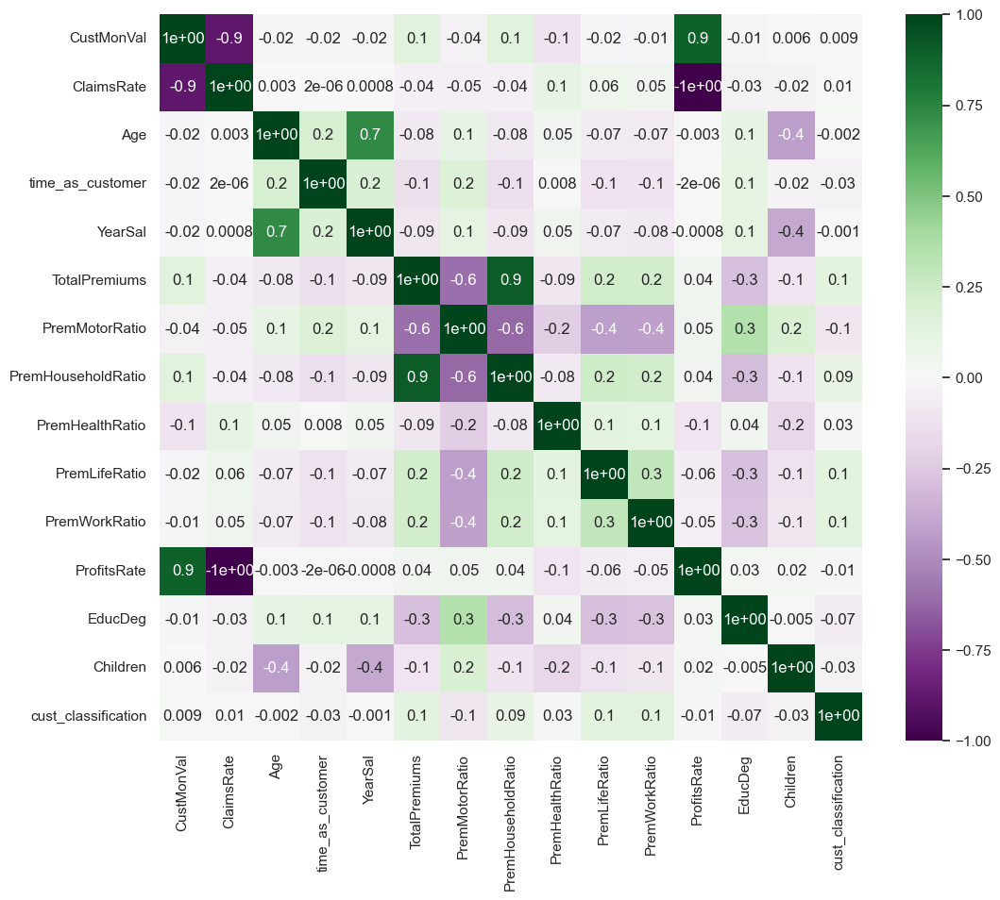

In [74]:
# Metric Variables Correlation Matrix
featuresToCorrelate = metric_features.copy()
featuresToCorrelate.extend(['EducDeg','Children','cust_classification'])
cor_heatmap(df_feature_selection[featuresToCorrelate].corr(method='kendall'))

### 4.6.2 Box plots of each categorical feature among different features

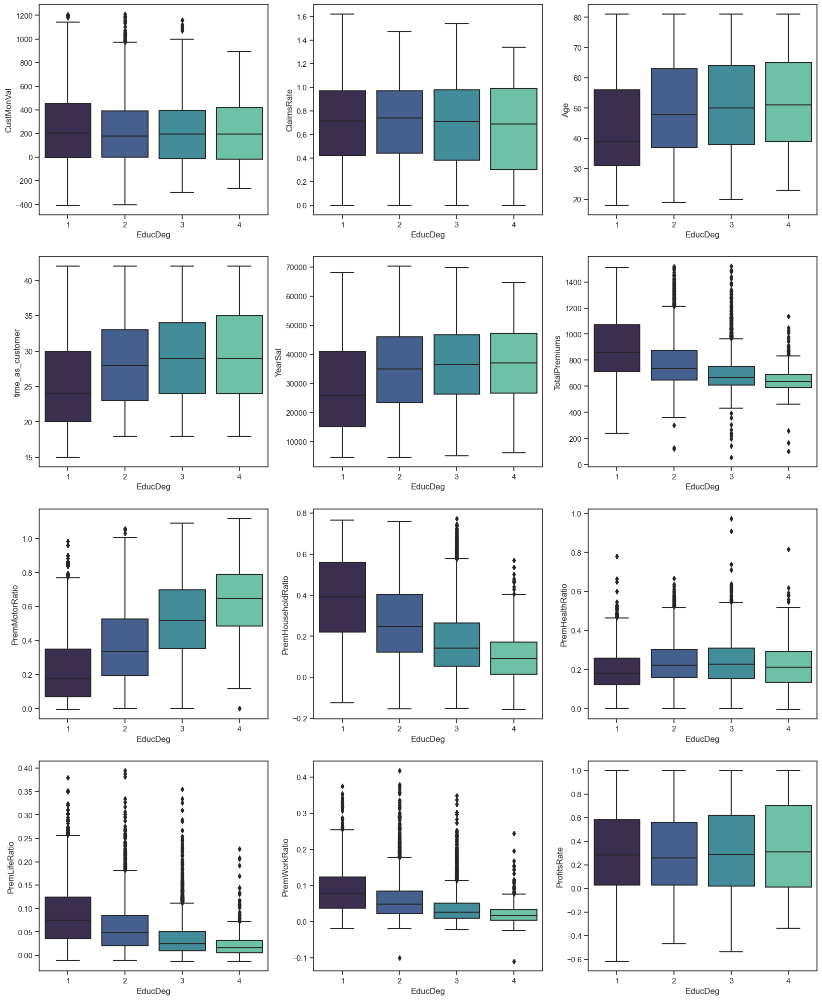

In [75]:
sns.set(style = "ticks")

fig, axes = plt.subplots(4, 3, figsize=(20, 25))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x = df_feature_selection["EducDeg"], \
                y = df_feature_selection[feat], ax = ax, palette='mako')

plt.show()

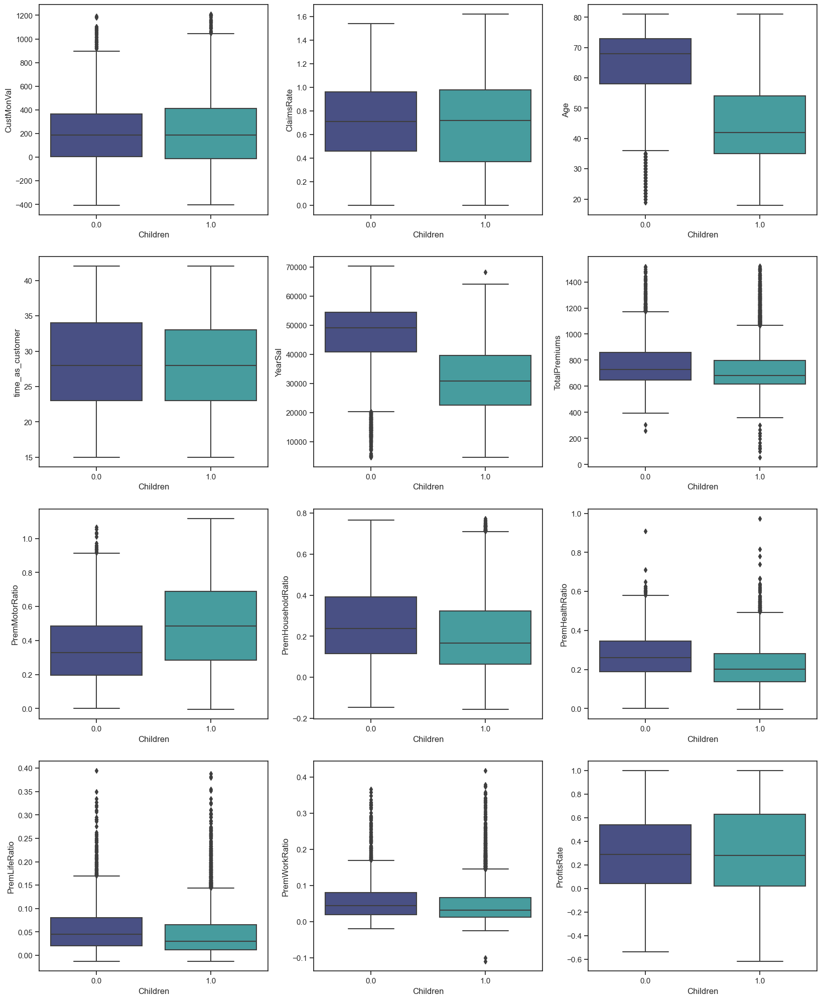

In [76]:
sns.set(style = "ticks")

fig, axes = plt.subplots(4, 3, figsize=(20, 25))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x = df_feature_selection["Children"], \
                y = df_feature_selection[feat], ax = ax, palette='mako')

plt.show()

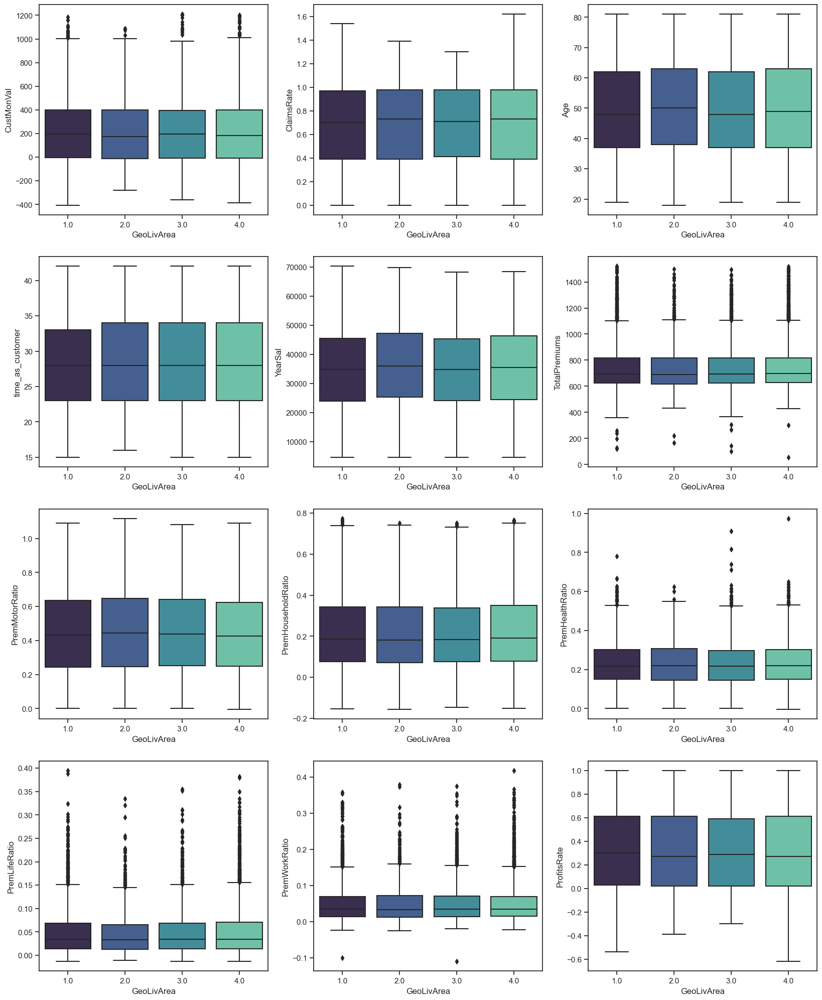

In [77]:
sns.set(style = "ticks")

fig, axes = plt.subplots(4, 3, figsize=(20, 25))

for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x = df_feature_selection["GeoLivArea"], \
                y = df_feature_selection[feat], ax = ax, palette='mako')

plt.show()

### 4.6.2. Removing redundant features.
1.  __Age__ is kept with __MonthSal__ because both are important to the context.
3. __InsuredRate__ and __CustMonVal__ are eliminated instead of __ProfitsRate__ because __ProfitsRate__ is better for the final analysis and has better correlation with other features.
4. __TotalPremiums__ is eliminated because the premiums are also a ratio.
5. __cust classification__ is eliminated because has no correlation with other features.
6. __GeoLivArea__ is eliminated because makes no difference on the data.

* * *



### Numerical Data



| Predictor | Keep? | 
| --- | --- |
| YearSal | Keep | 
| CustMonVal | Discard |
| ClaimsRate | Discard | 
| PremMotorRate | Keep | 
| PremHouseholdRate | Keep | 
| PremLifeRate | Keep | 
| PremHealthRate | Keep | 
| PremWorkRate | Keep | 
| Age | Keep |
| time_as_customer | Discard | 
| TotalPremiums | Discard | 
| ProfitsRate | Keep |


### Categorical Data



| Predictor | Keep? | 
| --- | --- |
| EducDeg | Keep | 
| Children | Keep |
| GeoLivArea | Discard | 
| cust_classification | Discard | 

* * *

In [78]:
features_selected=['PremMotorRatio','PremHouseholdRatio','PremLifeRatio','PremHealthRatio','PremWorkRatio',\
                   'Age','YearSal','ProfitsRate','EducDeg','Children']
for column in df_feature_selection.columns.drop(features_selected):
    if(column in metric_features):
        metric_features.remove(column)
    elif (column in non_metric_features):
        non_metric_features.remove(column)
df_feature_selection = df_feature_selection[features_selected].copy()

locator: <matplotlib.ticker.AutoLocator object at 0x000001ECF6286550>


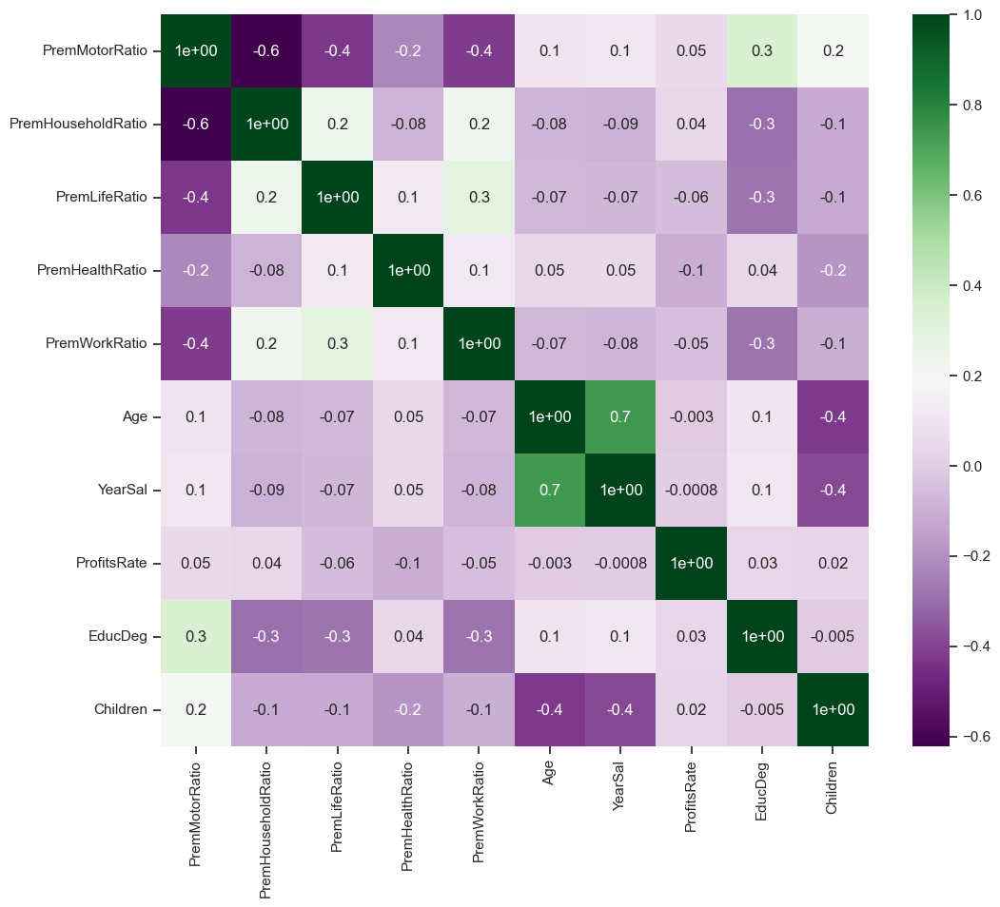

In [79]:
cor_heatmap(df_feature_selection.corr(method='kendall'))

In [80]:
df_processed=df_feature_selection.copy()

### __Data Normalization__

Metric features are scaled through the __MinMaxScaler__ method because the data don't follow normal distribution.

In [81]:
features_to_scale= ['Age','YearSal']
scaler = MinMaxScaler()
df_processed[features_to_scale] = scaler.fit_transform(df_processed[features_to_scale])
df_outliers[features_to_scale] = scaler.transform(df_outliers[features_to_scale])

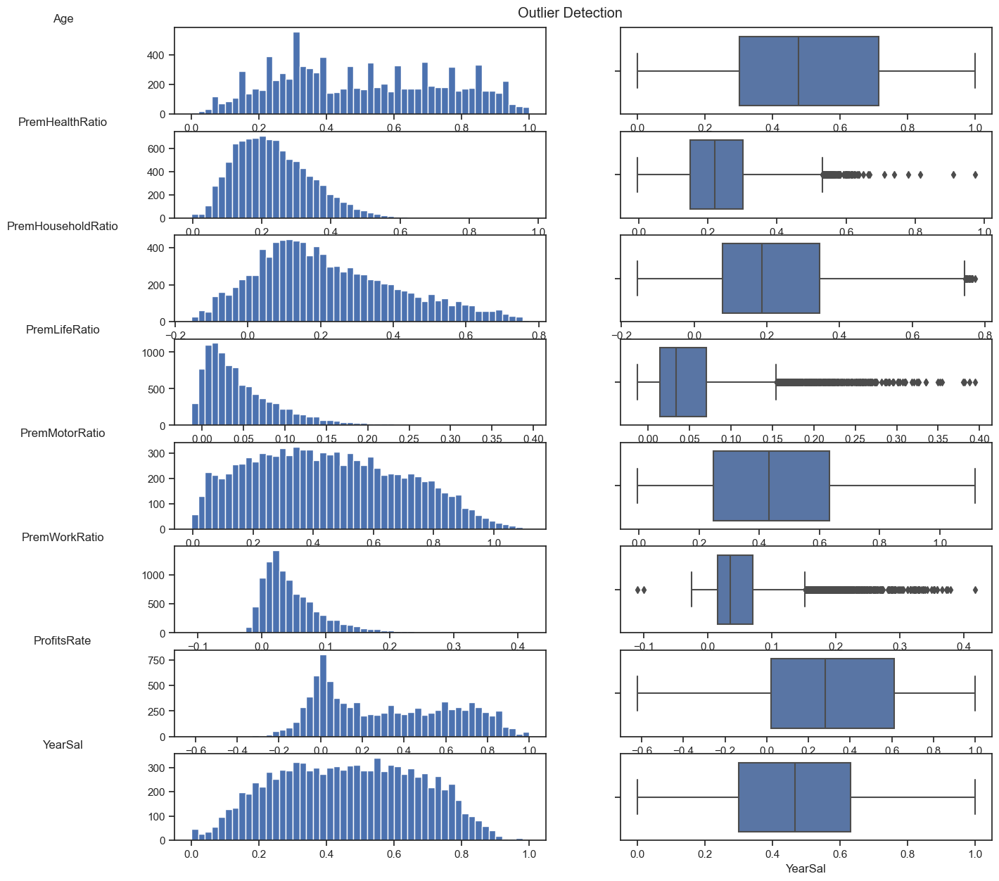

In [82]:
hist_box_maker(df_processed[metric_features],"Outlier Detection",15,15)

In [83]:
df= df_processed.copy()

In [84]:
df.head(3)

,PremMotorRatio,PremHouseholdRatio,PremLifeRatio,PremHealthRatio,PremWorkRatio,Age,YearSal,ProfitsRate,EducDeg,Children
CustID,,,,,,,,,,
1.0,0.565,0.119,0.071,0.220,0.025,0.253968,0.393345,0.61,2,1.0
2.0,0.085,0.457,0.213,0.128,0.117,0.269841,0.073379,-0.12,2,1.0
3.0,0.278,0.303,0.117,0.168,0.134,0.444444,0.414676,0.72,1,0.0


# 5. Modelling

## 5.0 Data Partition

Create demographic features and consumption features

In [85]:
demographic_features= ['Age','EducDeg','YearSal','Children']
demographic_metric_features= list(set(demographic_features).intersection(metric_features))
consumption_features= df.columns.drop(demographic_features).to_list()
consumption_metric_features= list(set(consumption_features).intersection(metric_features))

In [86]:
demographic_df = df[demographic_features].copy()
consumption_df = df[consumption_features].copy()

## 5.1. Demographic Features Clustering

### 5.1.1. Hierarchical Clustering

#### Defining the method and number of clusters to use

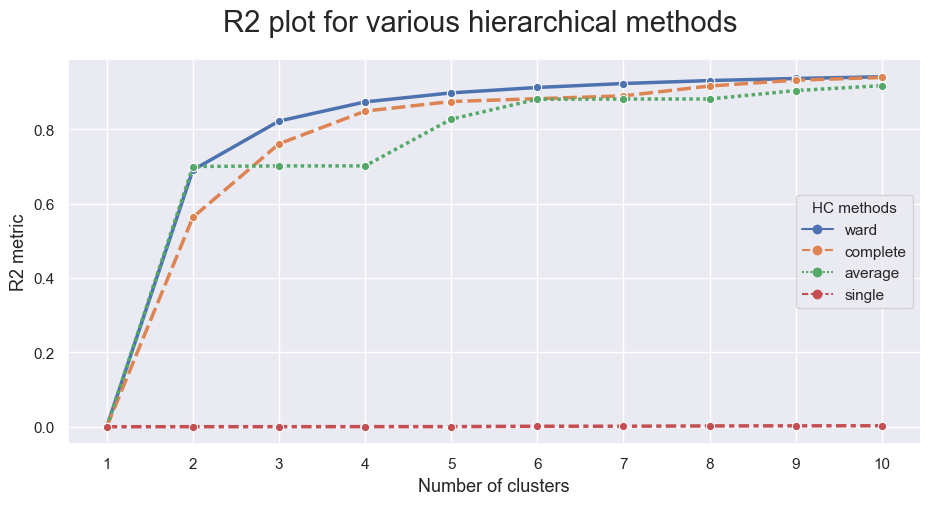

In [88]:
hierarchical_clustering_methods_nclust_analysis(demographic_df[demographic_metric_features],["ward", "complete", "average", "single"], 10);

Overall, only apllying hierarchical clustering doesn not give a good solution.<br>
However, from the linkage __ward__ and distance __euclidean__ it's plotted a dendrogram with multiple clustering leaves

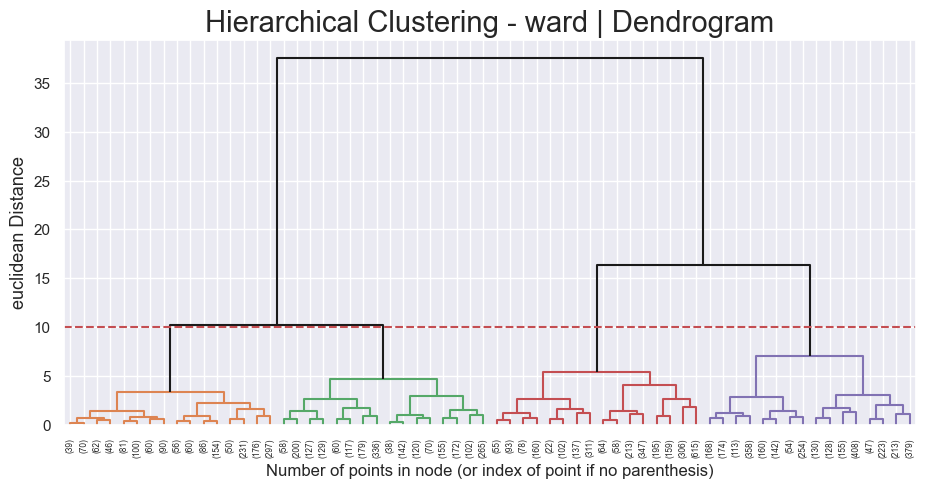

In [90]:
plot_dendrogram(dataframe=demographic_df[demographic_metric_features],y_threshold=10,linkage="ward",affinity='euclidean')

#### Final Hierachical Clustering Solution

The predictions from the model with 4 clusters are saved into de column ***hc_labels***, since it is the elbow on r2 score and can be well represented in the dendogram.

In [91]:
demographic_df_hc= demographic_df.copy();

hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=4)
demographic_df_hc['labels'] =  hclust.fit_predict(demographic_df_hc[demographic_metric_features])
demographic_df_hc.groupby('labels').mean()

,Age,EducDeg,YearSal,Children
labels,,,,
0,0.440076,2.592080,0.429821,0.917901
1,0.681099,2.575330,0.611152,0.655507
2,0.225943,2.304974,0.221307,0.867925
3,0.862803,2.600724,0.759073,0.123643


### 5.1.2. K-Means Clustering

#### Defining the number of clusters

#### Through Inertia and Silhouette Score Plots

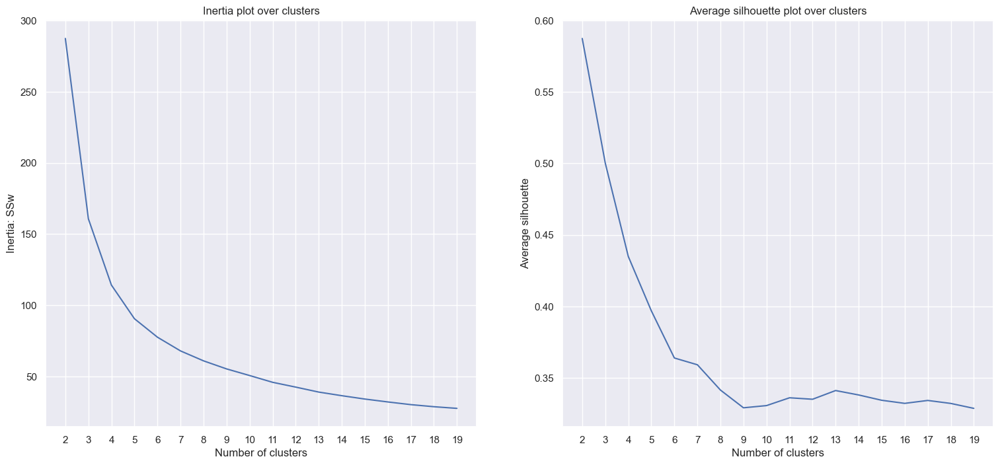

In [92]:
plot_inertia_silhouette_scores(demographic_df[demographic_metric_features],2,20)

#### 3 clusters seems the best choice

#### Through hierarchical clustering

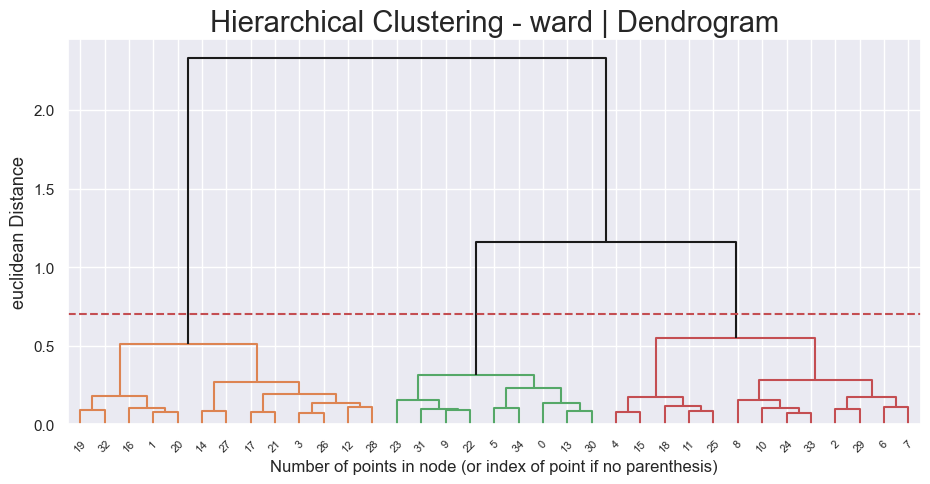

In [94]:
kmclust2 = KMeans(n_clusters=35, init='k-means++', n_init=15, random_state=1)
kmclust2.fit(demographic_df[demographic_metric_features])
kmeansCentroids=kmclust2.cluster_centers_

plot_dendrogram(dataframe=kmeansCentroids,y_threshold=0.7,linkage="ward",affinity='euclidean')

#### Analysing all methods, 3 is choosen as the K for KMeans.

#### Final KMeans Clustering Solution

In [95]:
demographic_df_km= demographic_df.copy();

kmclust = KMeans(n_clusters=3, init='k-means++', n_init=15, random_state=1)
demographic_df_km['labels'] = kmclust.fit_predict(demographic_df_km[demographic_metric_features])
demographic_df_km.groupby('labels').mean()

,Age,EducDeg,YearSal,Children
labels,,,,
0,0.511894,2.588634,0.488793,0.895383
1,0.251479,2.368253,0.250081,0.884605
2,0.799408,2.589453,0.702570,0.315108


### 5.1.3. K-Prototypes Clustering

In [96]:
categorical_cols = []
for eachNonMetricFeature in non_metric_features:
    categorical_cols.append(demographic_df.columns.get_loc(eachNonMetricFeature))

In [97]:
categorical_cols

[1, 3]

1153.3501309116311
830.7991304317068
657.0249241811993
572.430995495331


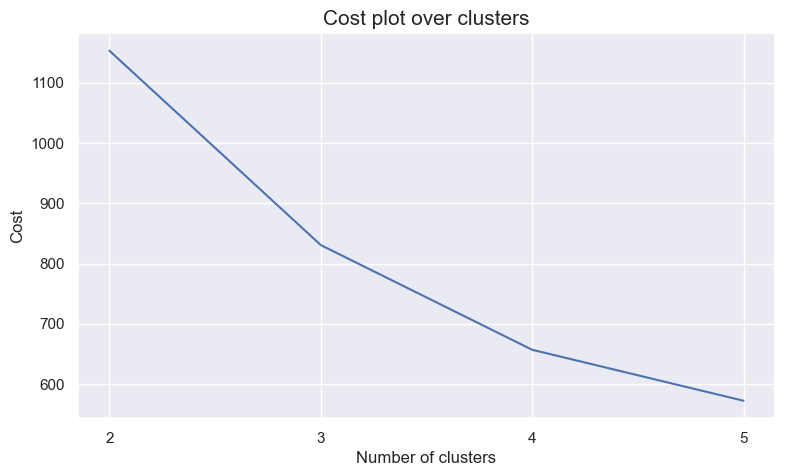

In [99]:
range_clusters = range(2, 6)

cost = []
for n_clus in range_clusters:
    kpclust = KPrototypes(n_clusters=n_clus, random_state=1,n_jobs=-1)
    kpclust.fit(demographic_df,categorical=categorical_cols)
    cost.append(kpclust.cost_) 
    print(kpclust.cost_)

# The cost plot
plt.figure(figsize=(9,5))
plt.plot(cost)
plt.ylabel("Cost")
plt.xlabel("Number of clusters")
plt.xticks(np.arange(len(range_clusters)),np.arange(2, max(range_clusters)+1, 1))
plt.title("Cost plot over clusters", size=15)
plt.show()

### 4 is choosen as the K for KPrototypes.

In [100]:
demographic_df_kp= demographic_df.copy();

kpclust = KPrototypes(n_clusters=4, random_state=1,n_jobs=-1) 
demographic_df_kp['labels']=kpclust.fit_predict(demographic_df_kp,categorical=categorical_cols)

In [101]:
demographic_df_kp.groupby('labels').agg(
    {
        'EducDeg': [lambda x: x.value_counts().index[0],'mean'],
        'Children': [lambda x: x.value_counts().index[0],'mean'],
        'Age': [lambda x: x.value_counts().index[0],'mean'],
        'YearSal': [lambda x: x.value_counts().index[0],'mean']
    }
).rename(columns={'<lambda_0>': 'mode'})

EducDeg           Children                 Age             YearSal  \
          mode      mean     mode      mean      mode      mean      mode   
labels                                                                      
0            3  2.742891      1.0  0.975571  0.682540  0.612536  0.502133   
1            3  2.588713      0.0  0.022232  0.825397  0.817540  0.734428   
2            2  2.064811      1.0  0.900596  0.349206  0.346099  0.377560   
3            3  2.629330      1.0  0.893380  0.333333  0.265571  0.227176   

                  
            mean  
labels            
0       0.567460  
1       0.710284  
2       0.340714  
3       0.265894

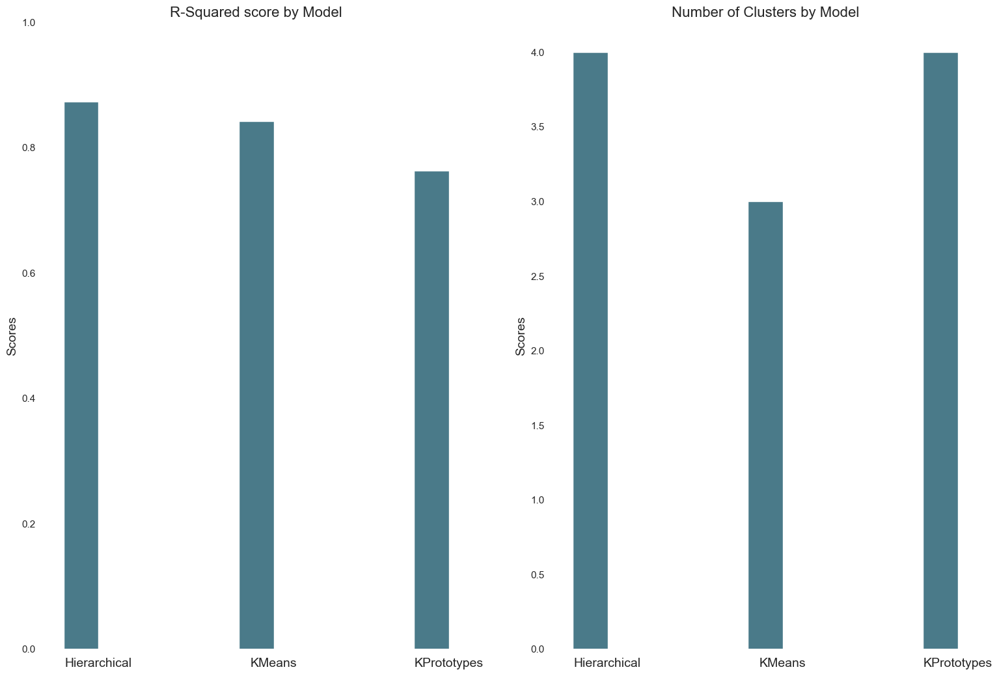

In [103]:
demographic_models_dataframes = {
    "Hierarchical": demographic_df_hc[demographic_metric_features+['labels']],
    "KMeans": demographic_df_km[demographic_metric_features+['labels']],
    "KPrototypes": demographic_df_kp[demographic_metric_features+['labels']],
}
plot_models_r2_nclust(demographic_models_dataframes,0.0)

In [104]:
demographic_df=demographic_df_kp.copy()

## 5.2. Consumption Features Clustering

### 5.2.1. Hierarchical Clustering

#### Defining the method and number of clusters to use

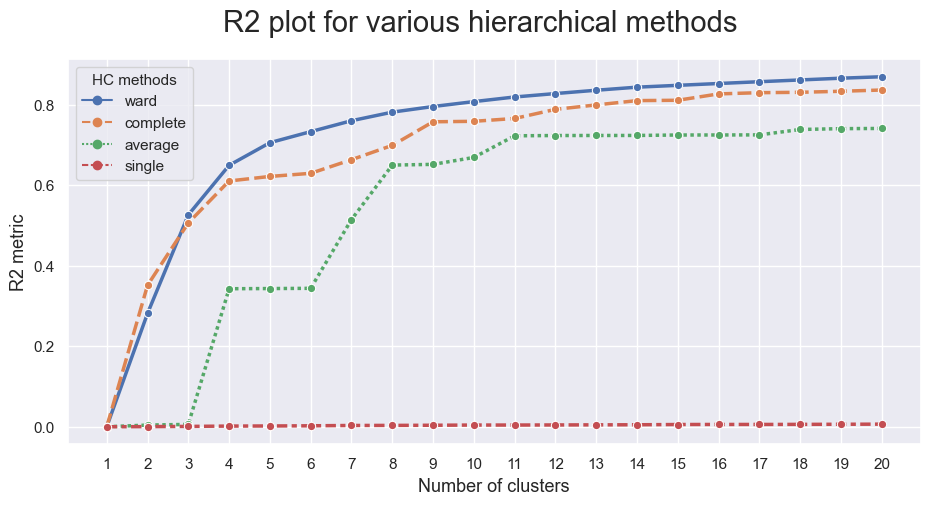

In [105]:
hierarchical_clustering_methods_nclust_analysis(consumption_df,["ward", "complete", "average", "single"], 20);

Overall, only apllying hierarchical clustering doesn not give a good solution.<br>
However, from the linkage __ward__ and distance __euclidean__ it's plotted a dendrogram with multiple clustering leaves

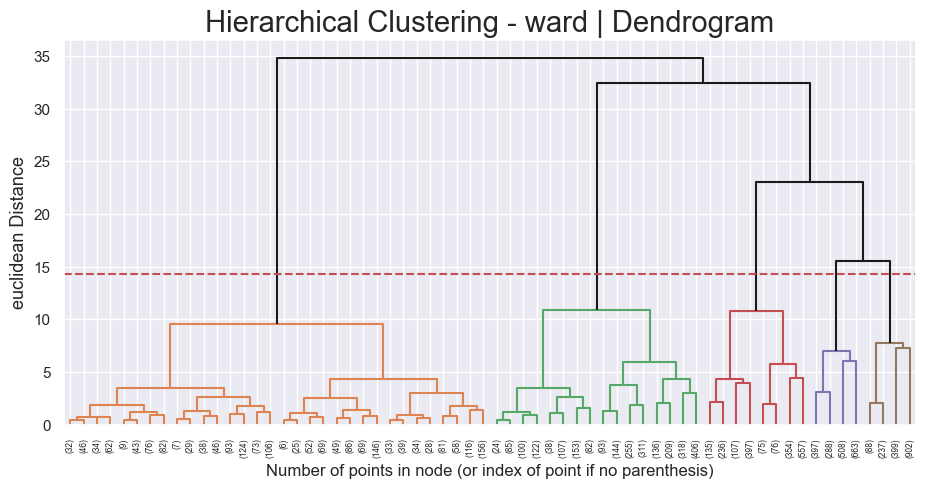

In [106]:
plot_dendrogram(dataframe=consumption_df,y_threshold=14.3,linkage="ward",affinity='euclidean')

#### Final Hierachical Clustering Solution

The predictions from the model with 4 clusters are saved into de column ***hc_labels***, since it is the elbow on r2 score and can be well represented in the dendogram.

In [107]:
consumption_df_hc = consumption_df.copy()

hclust = AgglomerativeClustering(linkage='ward', affinity='euclidean', n_clusters=5)
consumption_df_hc['labels'] = hclust.fit_predict(consumption_df_hc)
consumption_df_hc.groupby('labels').mean()

,PremMotorRatio,PremHouseholdRatio,PremLifeRatio,PremHealthRatio,PremWorkRatio,ProfitsRate
labels,,,,,,
0,0.647945,0.080936,0.027873,0.214469,0.028763,0.029384
1,0.223388,0.381550,0.074249,0.246554,0.074265,0.022736
2,0.215371,0.430092,0.068359,0.214226,0.071940,0.615185
3,0.693277,0.070813,0.023571,0.189625,0.022697,0.724843
4,0.350418,0.222343,0.062137,0.304143,0.060949,0.351250


### 5.2.2. K-Means Clustering

#### Defining the number of clusters

#### Through Inertia and Silhouette Score Plots

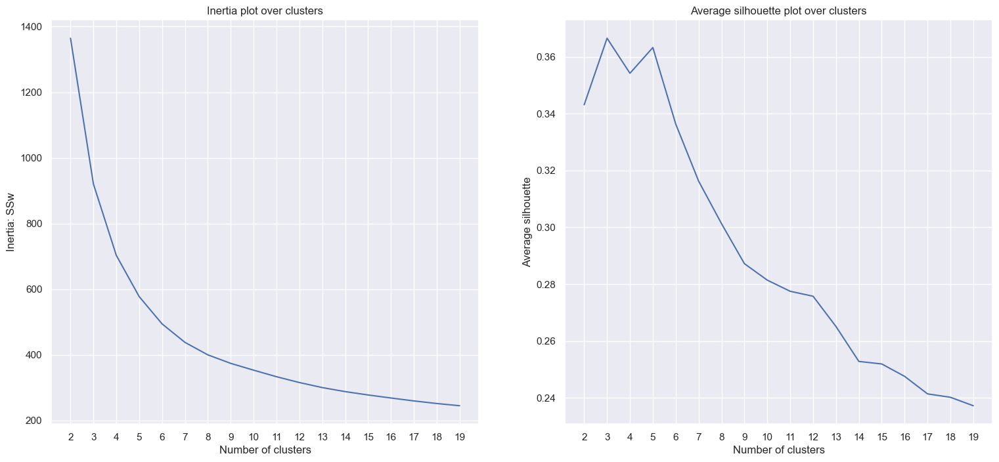

In [108]:
plot_inertia_silhouette_scores(consumption_df,2,20)

#### 5 clusters is the best solution

#### Through hierarchical clustering

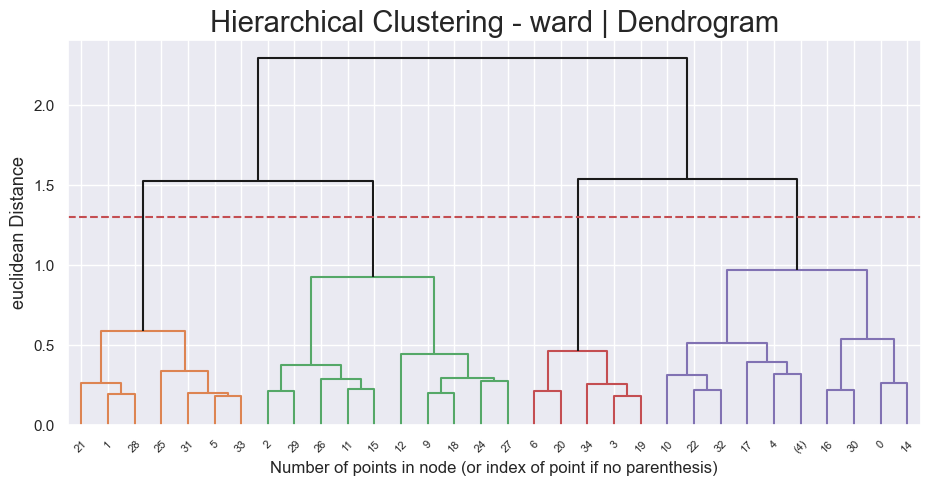

In [109]:
kmclust2 = KMeans(n_clusters=35, init='k-means++', n_init=15, random_state=1)
kmclust2.fit(consumption_df)
kmeansCentroids=kmclust2.cluster_centers_

plot_dendrogram(dataframe=kmeansCentroids,y_threshold=1.3,linkage="ward",affinity='euclidean')

#### Analysing all methods, 5 is choosen as the K for KMeans.

#### Final KMeans Clustering Solution

In [110]:
consumption_df_km = consumption_df.copy()
kmclust = KMeans(n_clusters=5, init='k-means++', n_init=15, random_state=1)
# Characterizing the final clusters
consumption_df_km['labels'] = kmclust.fit_predict(consumption_df_km)
consumption_df_km.groupby('labels').mean()

,PremMotorRatio,PremHouseholdRatio,PremLifeRatio,PremHealthRatio,PremWorkRatio,ProfitsRate
labels,,,,,,
0,0.690973,0.078490,0.023043,0.184602,0.022874,0.736256
1,0.664188,0.074955,0.026346,0.207456,0.027051,0.006719
2,0.201104,0.402527,0.077756,0.240666,0.077947,0.031920
3,0.190022,0.476321,0.069162,0.193049,0.071435,0.624043
4,0.361032,0.206477,0.060340,0.311983,0.060151,0.344736


In [111]:
get_r2_score(consumption_df_km,'labels')

0.7313773534487886

### 5.2.3. Self Organizing Maps

In [112]:
np.random.seed(42)

sm = sompy.SOMFactory().build(
    consumption_df.values, 
    mapsize=[50, 50],
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=consumption_df.columns
)
sm.train(n_job=-1, verbose='info', train_rough_len=100, train_finetune_len=100)
weights=sm.codebook.matrix.copy();

 Training...
 random_initialization took: 0.008000 seconds
 Rough training...
 radius_ini: 17.000000 , radius_final: 2.833333, trainlen: 100

 epoch: 1 ---> elapsed time:  0.425000, quantization error: 1.295663

 epoch: 2 ---> elapsed time:  0.466000, quantization error: 2.264000

 epoch: 3 ---> elapsed time:  0.460000, quantization error: 2.240161

 epoch: 4 ---> elapsed time:  0.468000, quantization error: 2.229557

 epoch: 5 ---> elapsed time:  0.478000, quantization error: 2.225508

 epoch: 6 ---> elapsed time:  0.478000, quantization error: 2.224135

 epoch: 7 ---> elapsed time:  0.489000, quantization error: 2.223048

 epoch: 8 ---> elapsed time:  0.475000, quantization error: 2.221931

 epoch: 9 ---> elapsed time:  0.491000, quantization error: 2.220668

 epoch: 10 ---> elapsed time:  0.552000, quantization error: 2.219440

 epoch: 11 ---> elapsed time:  0.563000, quantization error: 2.218372

 epoch: 12 ---> elapsed time:  0.559000, quantization error: 2.217366

 epoch: 13 --->

 epoch: 14 ---> elapsed time:  0.492000, quantization error: 1.510505

 epoch: 15 ---> elapsed time:  0.489000, quantization error: 1.503354

 epoch: 16 ---> elapsed time:  0.488000, quantization error: 1.496159

 epoch: 17 ---> elapsed time:  0.495000, quantization error: 1.488839

 epoch: 18 ---> elapsed time:  0.493000, quantization error: 1.481520

 epoch: 19 ---> elapsed time:  0.492000, quantization error: 1.473871

 epoch: 20 ---> elapsed time:  0.494000, quantization error: 1.466087

 epoch: 21 ---> elapsed time:  0.496000, quantization error: 1.457914

 epoch: 22 ---> elapsed time:  0.496000, quantization error: 1.449330

 epoch: 23 ---> elapsed time:  0.496000, quantization error: 1.439625

 epoch: 24 ---> elapsed time:  0.504000, quantization error: 1.428919

 epoch: 25 ---> elapsed time:  0.515000, quantization error: 1.420462

 epoch: 26 ---> elapsed time:  0.509000, quantization error: 1.411922

 epoch: 27 ---> elapsed time:  0.494000, quantization error: 1.402825

 epoch

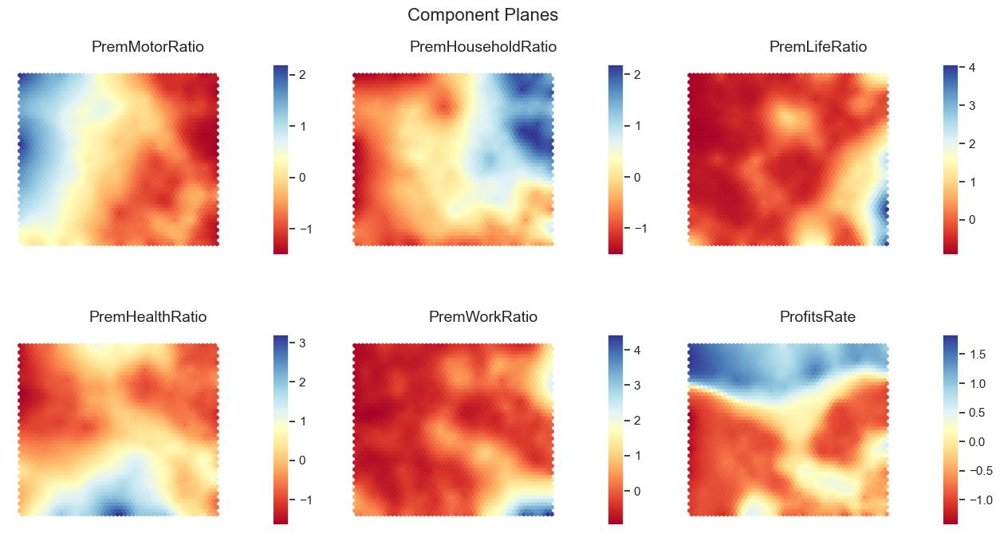

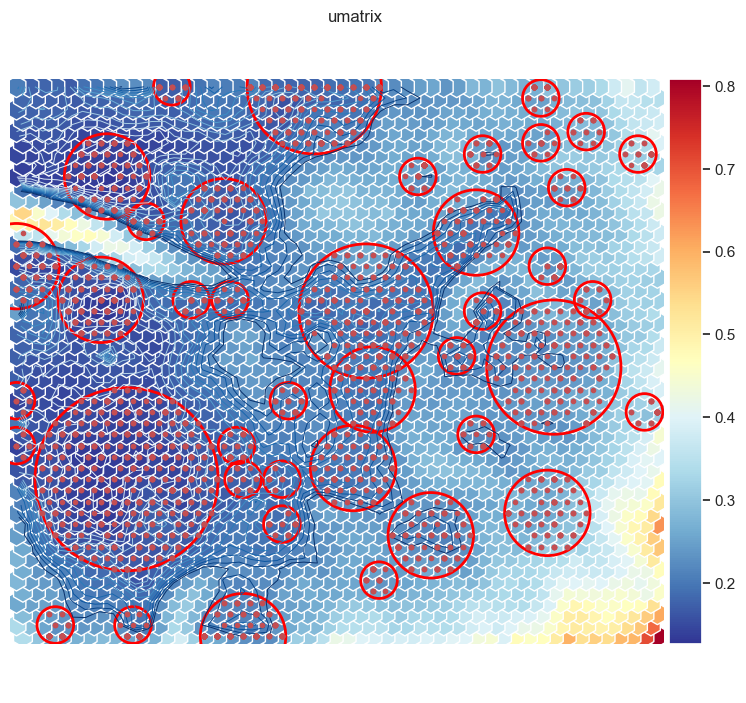

In [113]:
plot_component_planes(weights=weights,features=consumption_df.columns,
                      M=50,N=50,
                      figsize=(12,7),figlayout=(2,3),
                      title="Component Planes",
                      cmap=sns.color_palette("RdYlBu", as_cmap=True))

u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=False, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False,
    show_data=False, 
    contour=True, # Visualize isomorphic curves
    blob=True
)

plt.show()

#### Clustering with SOMs: K-means SOM vs Emergent SOM

#### K-Means on top of SOM units

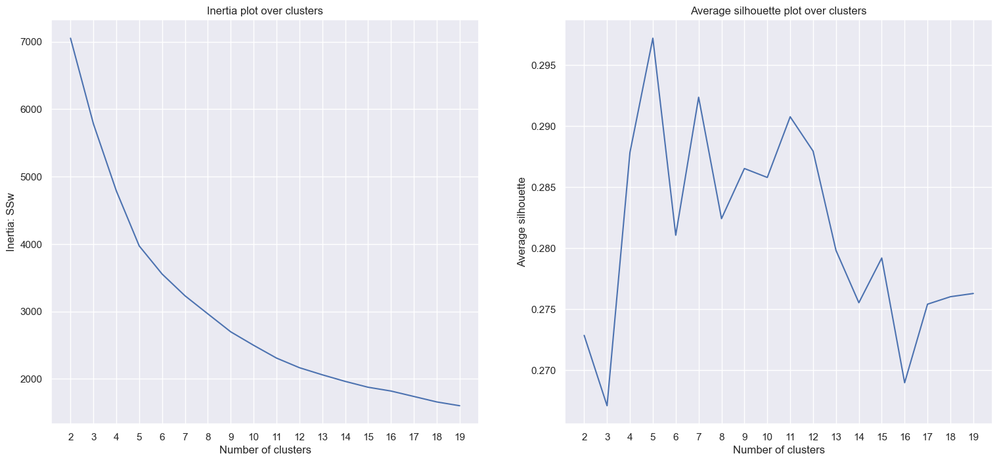

In [114]:
plot_inertia_silhouette_scores(weights,2,20)

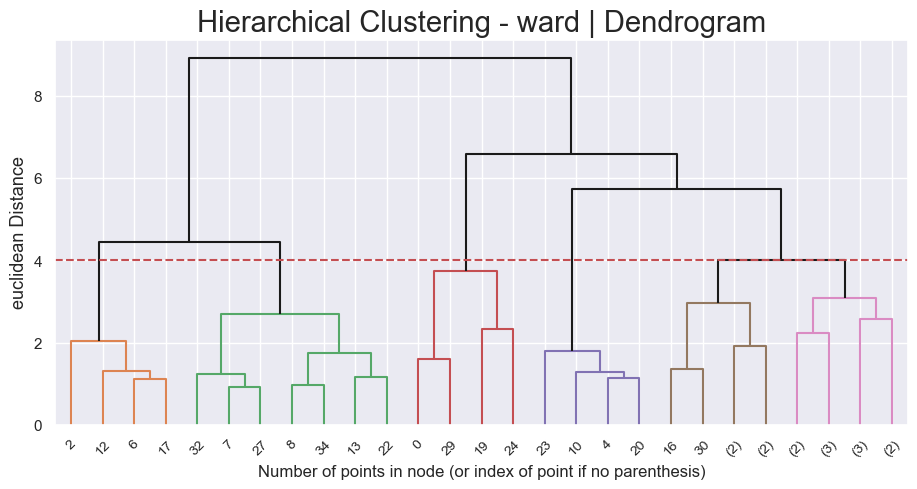

In [115]:
kmclust2 = KMeans(n_clusters=35, init='k-means++', n_init=15, random_state=1)
kmclust2.fit(weights)
kmeansCentroids=kmclust2.cluster_centers_

plot_dendrogram(dataframe=kmeansCentroids,y_threshold=4,linkage="ward",affinity='euclidean')

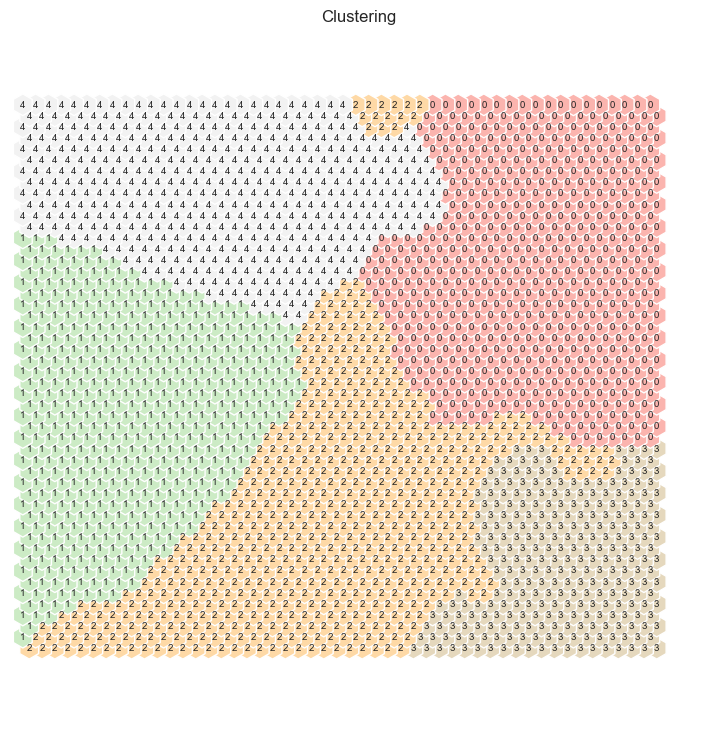

In [116]:
kmeans = KMeans(n_clusters=5, init='k-means++', n_init=20, random_state=1)
kmeans_nodelabels= kmeans.fit_predict(sm.codebook.matrix)
sm.cluster_labels = kmeans_nodelabels  # setting the cluster labels of sompy

hits = HitMapView(9, 9,"Clustering", text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

#### Hierarchical Clustering on top of SOM units

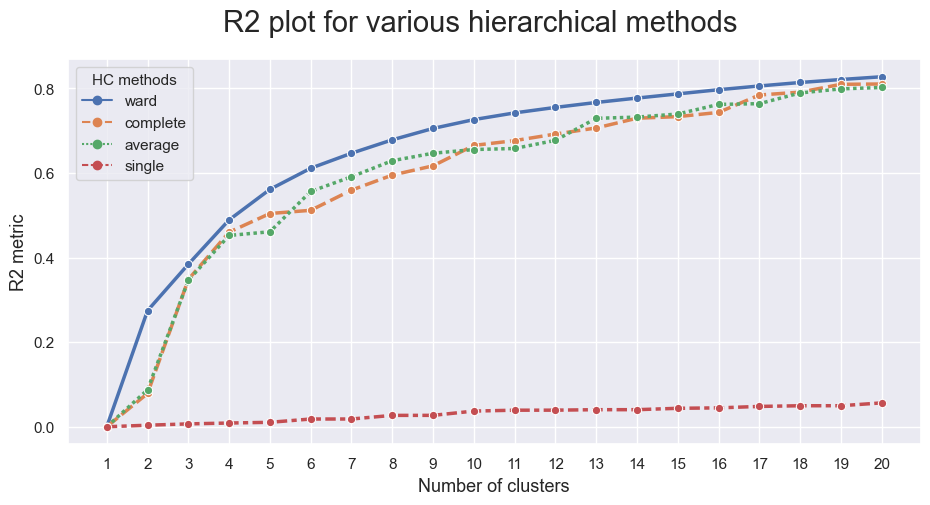

In [117]:
hierarchical_clustering_methods_nclust_analysis(pd.DataFrame(weights),["ward", "complete", "average", "single"], 20);

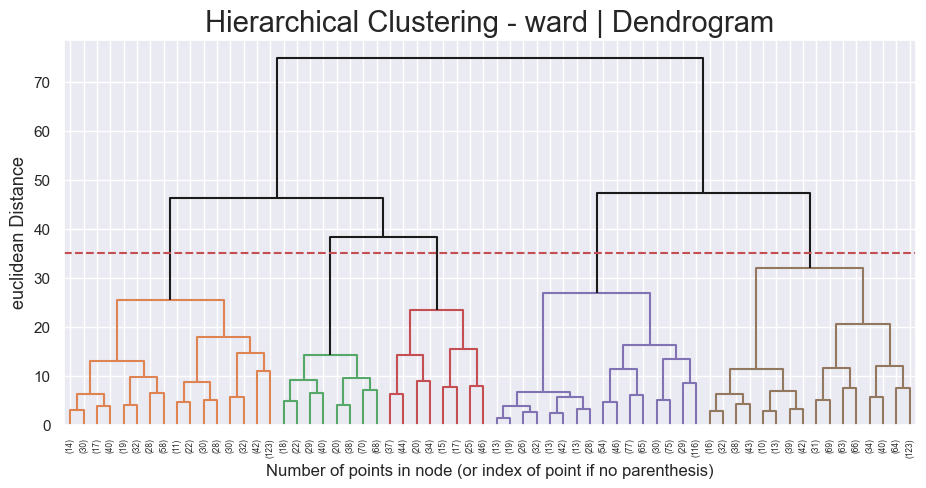

In [118]:
plot_dendrogram(dataframe=weights,y_threshold=35,linkage="ward",affinity='euclidean')

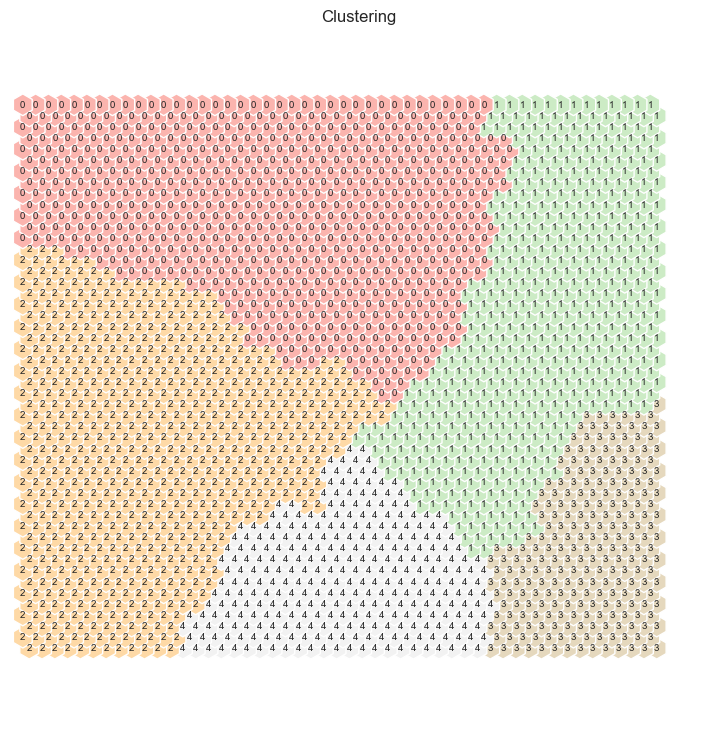

In [119]:
hierclust = AgglomerativeClustering(n_clusters=5, linkage='ward')
hierarchical_nodelabels = hierclust.fit_predict(weights)
sm.cluster_labels = hierarchical_nodelabels  # setting the cluster labels of sompy

hits  = HitMapView(9, 9,"Clustering",text_size=10)
hits.show(sm, anotate=True, onlyzeros=False, labelsize=7, cmap="Pastel1")

plt.show()

### Final SOM Clustering solution

In [120]:
consumption_df_som = consumption_df.copy()

#https://github.com/sevamoo/SOMPY/issues/73#issuecomment-390483158
data_labels = np.array([hierarchical_nodelabels[int(k)] for k in sm._bmu[0]]) 

consumption_df_som['labels'] = data_labels
consumption_df_som.groupby('labels').mean()

,PremMotorRatio,PremHouseholdRatio,PremLifeRatio,PremHealthRatio,PremWorkRatio,ProfitsRate
labels,,,,,,
0,0.575036,0.165454,0.029589,0.201602,0.028314,0.645817
1,0.174067,0.495164,0.066376,0.191767,0.072613,0.272561
2,0.642280,0.098915,0.024876,0.206980,0.026940,0.027101
3,0.253177,0.220367,0.131942,0.265574,0.128954,0.259897
4,0.311684,0.160855,0.056510,0.420662,0.050254,0.245535


### 5.2.4. Mean Shift

In [121]:
bandwidth = estimate_bandwidth(consumption_df, quantile=0.12, random_state=1, n_jobs=-1)
bandwidth

0.2971813528232025

In [122]:
# Perform mean-shift clustering with bandwidth set using estimate_bandwidth
consumption_df_ms = consumption_df.copy()

ms = MeanShift(bandwidth=bandwidth, bin_seeding=True, n_jobs=4)
consumption_df_ms['labels'] = ms.fit_predict(consumption_df)
consumption_df_ms.groupby('labels').mean()

,PremMotorRatio,PremHouseholdRatio,PremLifeRatio,PremHealthRatio,PremWorkRatio,ProfitsRate
labels,,,,,,
0,0.242140,0.360786,0.070407,0.256174,0.070480,0.312374
1,0.612440,0.102570,0.032560,0.218555,0.033871,0.005945
2,0.635692,0.110648,0.028485,0.196497,0.028664,0.718656
3,0.173313,0.061642,0.094791,0.580925,0.089403,-0.042388


In [123]:
Counter(consumption_df_ms['labels'])

Counter({2: 2456, 0: 4494, 1: 2932, 3: 67})

### 5.2.5. DBSCAN

#### Perform DBSCAN clustering

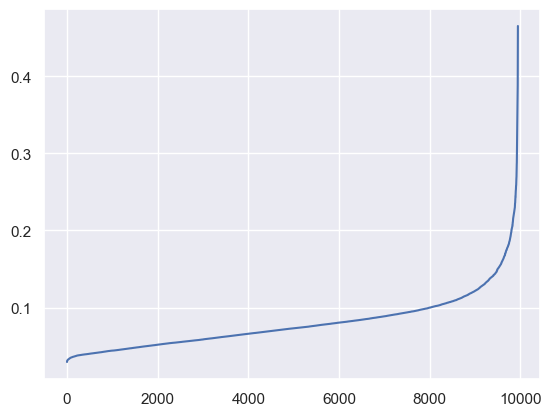

In [124]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=15)
neigh.fit(consumption_df)
distances, _ = neigh.kneighbors(consumption_df)
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [125]:
consumption_df_dbscan= consumption_df.copy();

dbscan = DBSCAN(eps=0.2, min_samples=5, n_jobs=4)
consumption_df_dbscan['labels'] = dbscan.fit_predict(consumption_df)

dbscan_n_clusters = len(np.unique(consumption_df_dbscan['labels']))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


In [126]:
Counter(consumption_df_dbscan['labels'])

Counter({0: 9931, -1: 18})

### 5.2.6. GM Model (Gaussian Mixture Model )

#### Defining number of components:

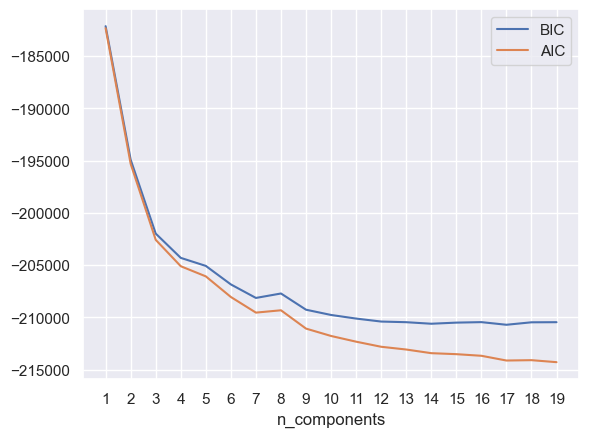

In [127]:
# Selecting number of components based on AIC and BIC
n_components = np.arange(1, 20)
models = [GaussianMixture(n, covariance_type='full', n_init=10, random_state=1).fit(consumption_df)
          for n in n_components]

bic_values = [m.bic(consumption_df) for m in models]
aic_values = [m.aic(consumption_df) for m in models]
plt.plot(n_components, bic_values, label='BIC')
plt.plot(n_components, aic_values, label='AIC')
plt.legend(loc='best')
plt.xlabel('n_components')
plt.xticks(n_components)
plt.show()

#### Performing GMM clustering

In [128]:
# Performing GMM clustering
consumption_df_gm = consumption_df.copy()
gmm = GaussianMixture(n_components=10, covariance_type='full', n_init=10, init_params='kmeans', random_state=1)
consumption_df_gm['labels'] = gmm.fit_predict(consumption_df)
consumption_df_gm.groupby('labels').mean()

,PremMotorRatio,PremHouseholdRatio,PremLifeRatio,PremHealthRatio,PremWorkRatio,ProfitsRate
labels,,,,,,
0,0.297743,0.303727,0.074668,0.252362,0.071478,0.339141
1,0.649412,0.094227,0.018936,0.217421,0.019988,0.082981
2,0.466145,0.174087,0.038906,0.280865,0.039996,0.632070
3,0.654800,0.130788,0.014063,0.186635,0.013710,-0.003863
4,0.098645,0.573497,0.084383,0.156921,0.086550,0.025610
5,0.240479,0.148914,0.147669,0.310702,0.152279,0.198635
6,0.102685,0.584137,0.076530,0.155609,0.081013,0.663598
7,0.769396,0.050343,0.011118,0.158091,0.011046,0.800961
8,0.493289,0.197529,0.025881,0.257380,0.025909,0.487076


### 5.2.7. Models Comparison

In [129]:
consumption_models_dataframes = {
    "Hierarchical": consumption_df_hc,
    "KMeans": consumption_df_km,
    "SOM_Hierarchical": consumption_df_som,
    "MeanShift": consumption_df_ms,
    "DBSCAN": consumption_df_dbscan,
    "GaussianMixture": consumption_df_gm
}

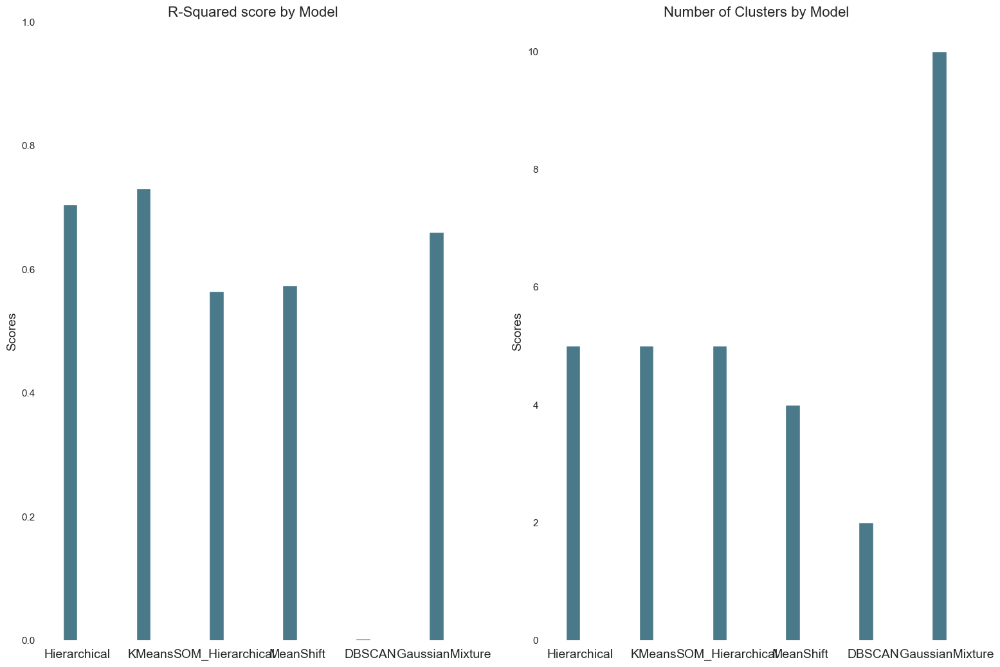

In [130]:
plot_models_r2_nclust(consumption_models_dataframes,0.0)

## Principal Components Analysis

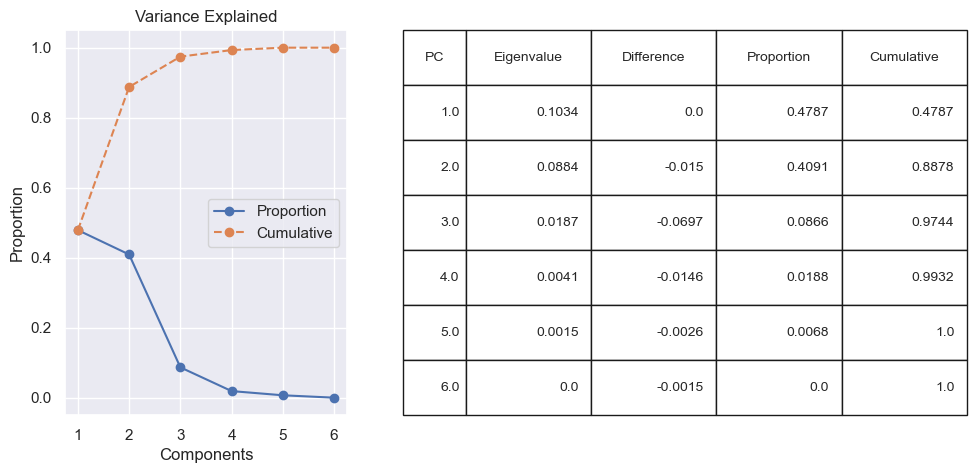

In [131]:
pca_feat=pca_analysis(consumption_df)

Since the two Principal Components represent more than 80% of the data's variance, it can be plotted in a 2-dimension scatterplot.

In [132]:
#Two components are choosen, since accumulate more than 60% of variance
pca_features = ['PC0','PC1']
df_pca = pd.DataFrame(pca_feat[:,[0,1]], index=df.index, columns=pca_features)

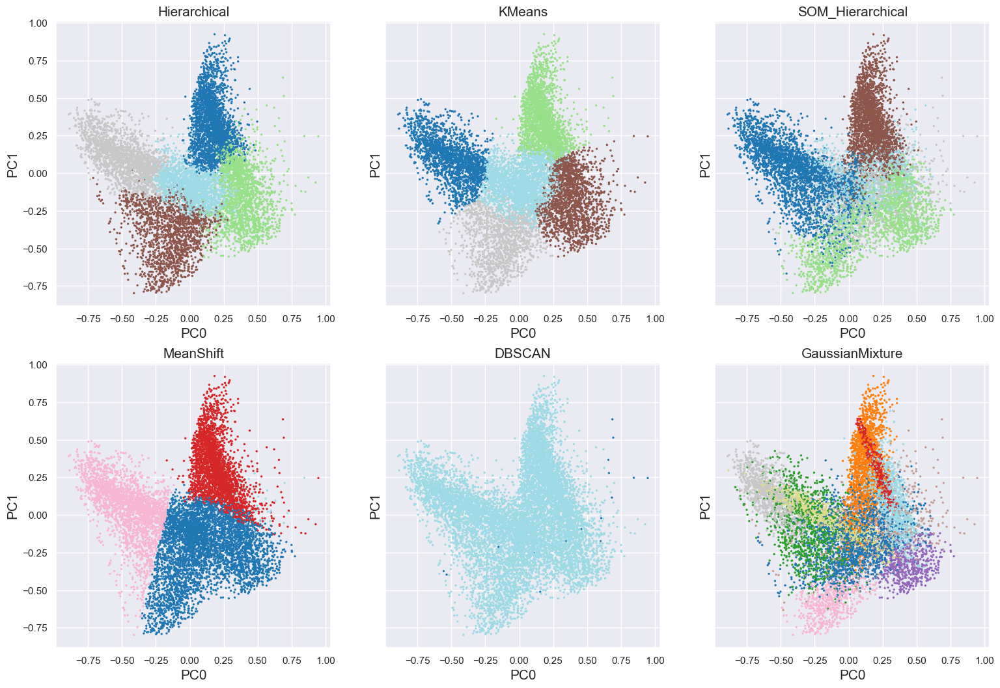

In [137]:
plot_2dClusters(df_pca,consumption_models_dataframes)

## T-distributed Stochastic Neighbor Embedding.

In [135]:
tsne = TSNE(random_state=15).fit_transform(consumption_df)
tsne_features=['TSNE0','TSNE1']
df_tsne = pd.DataFrame(tsne, index=consumption_df.index, columns=tsne_features)

C:\Users\Pedro\Anaconda\envs\Python_3-8\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Pedro\Anaconda\envs\Python_3-8\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


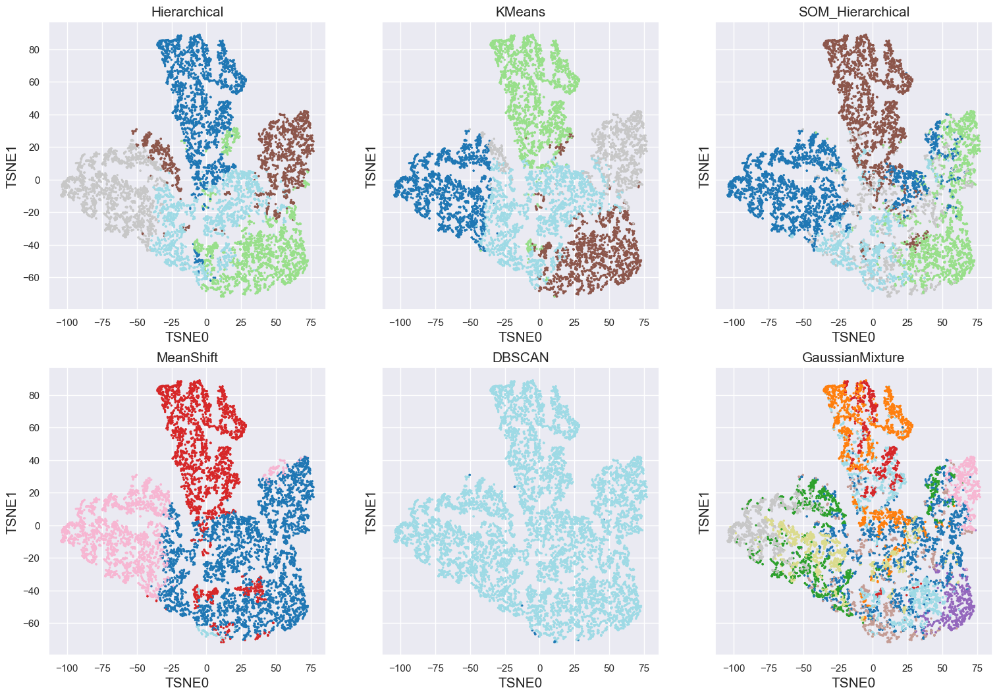

In [138]:
plot_2dClusters(df_tsne,consumption_models_dataframes)

## Uniform Manifold Approximation and Projection

In [139]:
umap_values = UMAP(random_state=15).fit_transform(consumption_df)
umap_features=['UMAP0','UMAP1']
df_umap = pd.DataFrame(umap_values, index=consumption_df.index, columns=umap_features)

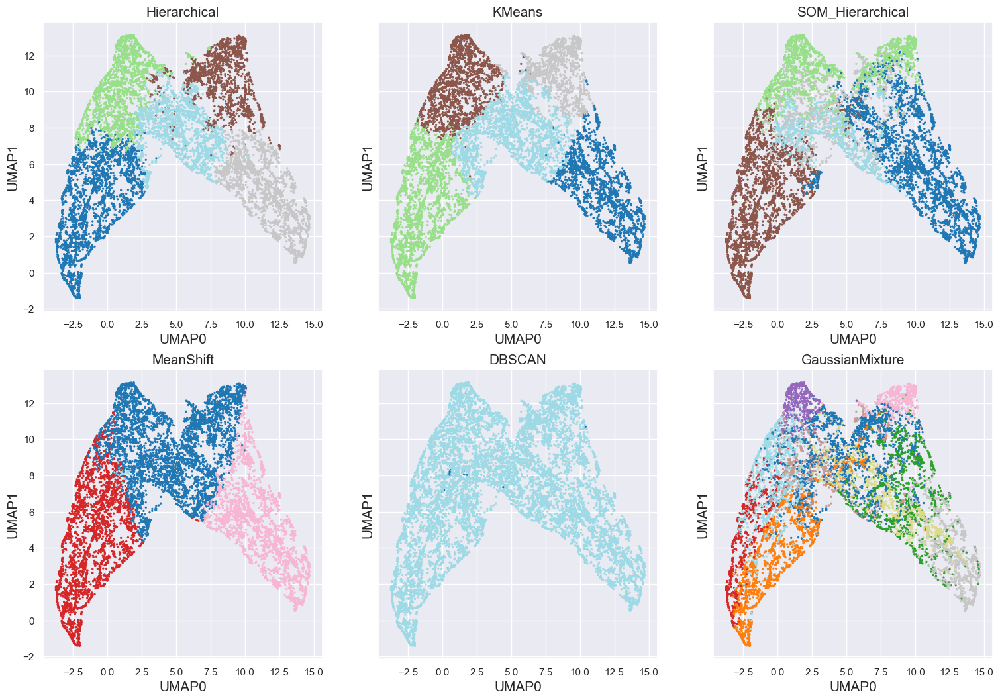

In [140]:
plot_2dClusters(df_umap,consumption_models_dataframes)

In [141]:
consumption_df=consumption_df_km.copy()

## 5.3. Merging Clusters

In [142]:
df['demographic_labels']=demographic_df['labels']
df['consumption_labels']=consumption_df['labels']

In [143]:
df_centroids = df.groupby(['demographic_labels', 'consumption_labels'])\
    [metric_features].mean()
df_centroids

Age   YearSal  PremMotorRatio  \
demographic_labels consumption_labels                                       
0                  0                   0.588659  0.551916        0.733409   
                   1                   0.594613  0.555592        0.715136   
                   2                   0.658587  0.604092        0.285923   
                   3                   0.645073  0.601141        0.275269   
                   4                   0.648448  0.582768        0.417799   
1                  0                   0.788078  0.690333        0.618323   
                   1                   0.811427  0.710362        0.580372   
                   2                   0.823361  0.715713        0.226356   
                   3                   0.816200  0.709406        0.210132   
                   4                   0.827842  0.714160        0.342945   
2                  0                   0.422520  0.418734        0.693962   
                   1                   0.423288  0.415499        0.662300   
                   2                   0.284573  0.275175        0.184416   
                   3                   0.275671  0.268449        0.175681   
                   4                   0.322766  0.324150        0.348748   
3                  0                   0.318089  0.321947        0.665071   
                   1                   0.314318  0.321564        0.651639   
                   2                   0.214553  0.201212        0.158428   
                   3                   0.212419  0.200854        0.147314   
                   4                   0.254131  0.264863        0.352491   

                                       PremHouseholdRatio  PremHealthRatio  \
demographic_labels consumption_labels                                        
0                  0                             0.071163         0.152961   
                   1                             0.074947         0.164234   
                   2                             0.386464         0.206405   
                   3                             0.443934         0.166553   
                   4                             0.222762         0.245146   
1                  0                             0.098691         0.229493   
                   1                             0.075681         0.274719   
                   2                             0.362115         0.286590   
                   3                             0.451212         0.218837   
                   4                             0.201962         0.342211   
2                  0                             0.079620         0.176775   
                   1                             0.078137         0.200062   
                   2                             0.408508         0.234520   
                   3                             0.483962         0.193912   
                   4                             0.211645         0.306004   
3                  0                             0.077299         0.213820   
                   1                             0.071361         0.229577   
                   2                             0.442758         0.217263   
                   3                             0.504090         0.184774   
                   4                             0.194862         0.329026   

                                       PremLifeRatio  PremWorkRatio  \
demographic_labels consumption_labels                                 
0                  0                        0.021283       0.021167   
                   1                        0.022471       0.023188   
                   2                        0.056856       0.064338   
                   3                        0.055239       0.059025   
                   4                        0.055081       0.059199   
1                  0                        0.026582       0.026908   
                   1                        0.034652       0.034

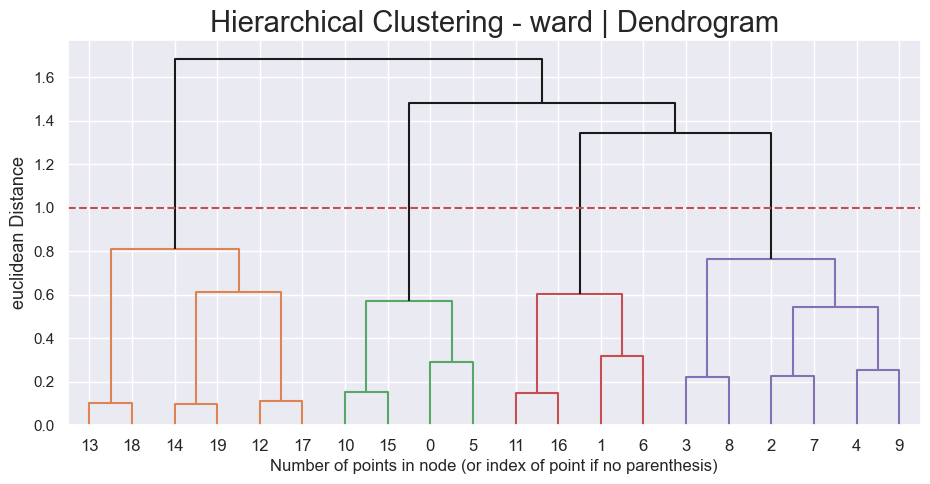

In [144]:
plot_dendrogram(dataframe=df_centroids,y_threshold=1,linkage="ward",affinity='euclidean')

In [145]:
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=4
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

Age   YearSal  PremMotorRatio  \
demographic_labels consumption_labels                                       
0                  0                   0.588659  0.551916        0.733409   
                   1                   0.594613  0.555592        0.715136   
                   2                   0.658587  0.604092        0.285923   
                   3                   0.645073  0.601141        0.275269   
                   4                   0.648448  0.582768        0.417799   
1                  0                   0.788078  0.690333        0.618323   
                   1                   0.811427  0.710362        0.580372   
                   2                   0.823361  0.715713        0.226356   
                   3                   0.816200  0.709406        0.210132   
                   4                   0.827842  0.714160        0.342945   
2                  0                   0.422520  0.418734        0.693962   
                   1                   0.423288  0.415499        0.662300   
                   2                   0.284573  0.275175        0.184416   
                   3                   0.275671  0.268449        0.175681   
                   4                   0.322766  0.324150        0.348748   
3                  0                   0.318089  0.321947        0.665071   
                   1                   0.314318  0.321564        0.651639   
                   2                   0.214553  0.201212        0.158428   
                   3                   0.212419  0.200854        0.147314   
                   4                   0.254131  0.264863        0.352491   

                                       PremHouseholdRatio  PremHealthRatio  \
demographic_labels consumption_labels                                        
0                  0                             0.071163         0.152961   
                   1                             0.074947         0.164234   
                   2                             0.386464         0.206405   
                   3                             0.443934         0.166553   
                   4                             0.222762         0.245146   
1                  0                             0.098691         0.229493   
                   1                             0.075681         0.274719   
                   2                             0.362115         0.286590   
                   3                             0.451212         0.218837   
                   4                             0.201962         0.342211   
2                  0                             0.079620         0.176775   
                   1                             0.078137         0.200062   
                   2                             0.408508         0.234520   
                   3                             0.483962         0.193912   
                   4                             0.211645         0.306004   
3                  0                             0.077299         0.213820   
                   1                             0.071361         0.229577   
                   2                             0.442758         0.217263   
                   3                             0.504090         0.184774   
                   4                             0.194862         0.329026   

                                       PremLifeRatio  PremWorkRatio  \
demographic_labels consumption_labels                                 
0                  0                        0.021283       0.021167   
                   1                        0.022471       0.023188   
                   2                        0.056856       0.064338   
                   3                        0.055239       0.059025   
                   4                        0.055081       0.059199   
1                  0                        0.026582       0.026908   
                   1                        0.034652       0.034

In [146]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

# Mapping the hierarchical clusters on the centroids to the observations
df['merged_labels'] = df.apply(
    lambda row: cluster_mapper[
        (row['demographic_labels'], row['consumption_labels'])
    ], axis=1
)

# Merged cluster centroids
df.groupby('merged_labels').mean()[metric_features]

,Age,YearSal,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,ProfitsRate
merged_labels,,,,,,,,
0,0.262947,0.258713,0.236323,0.359537,0.251060,0.076937,0.076133,0.303354
1,0.763157,0.671079,0.306190,0.304854,0.271682,0.057578,0.059687,0.313642
2,0.512075,0.484116,0.690973,0.078490,0.184602,0.023043,0.022874,0.736256
3,0.524561,0.493251,0.664188,0.074955,0.207456,0.026346,0.027051,0.006719


In [147]:
df_unscaled = df.copy()
df_unscaled[features_to_scale] = scaler.inverse_transform(df[features_to_scale])
df_unscaled

,PremMotorRatio,PremHouseholdRatio,PremLifeRatio,PremHealthRatio,PremWorkRatio,Age,YearSal,ProfitsRate,EducDeg,Children,demographic_labels,consumption_labels,merged_labels
CustID,,,,,,,,,,,,,
1.0,0.565,0.119,0.071,0.220,0.025,34.0,30478.0,0.61,2,1.0,2,0,2
2.0,0.085,0.457,0.213,0.128,0.117,35.0,9478.0,-0.12,2,1.0,2,2,0
3.0,0.278,0.303,0.117,0.168,0.134,46.0,31878.0,0.72,1,0.0,2,3,0
4.0,0.304,0.072,0.059,0.518,0.047,35.0,15386.0,0.01,3,1.0,3,4,0
5.0,0.538,0.076,0.030,0.290,0.066,43.0,24682.0,0.10,3,1.0,3,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291.0,0.005,0.674,0.087,0.079,0.154,22.0,8764.0,0.15,1,1.0,3,2,0
10292.0,0.614,0.077,0.015,0.271,0.023,67.0,44632.0,0.04,4,0.0,1,1,3
10294.0,0.580,0.191,0.018,0.204,0.007,40.0,40852.0,0.79,3,1.0,0,0,2


## 5.4. Reclassifying Data

In [148]:
get_r2_score(df[metric_features+['merged_labels']],'merged_labels')

0.5588150188823721

In [149]:
get_r2_variables(df[metric_features+['merged_labels']],'merged_labels').drop('merged_labels')

Age                   0.586617
PremHealthRatio       0.090982
PremHouseholdRatio    0.450835
PremLifeRatio         0.204131
PremMotorRatio        0.684367
PremWorkRatio         0.186055
ProfitsRate           0.581785
YearSal               0.558389
dtype: float64

**Using a Decision Tree Classifier**

In [150]:
# Preparing the data
X = df.drop(columns=['demographic_labels','consumption_labels','merged_labels'])
y = df.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, random_state=41
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=41,max_depth=5)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly.".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 96.18% of the customers correctly.


In [151]:
pd.Series(dt.feature_importances_, index=X_train.columns).to_frame(name='Importance')

,Importance
PremMotorRatio,0.295640
PremHouseholdRatio,0.005248
PremLifeRatio,0.000407
PremHealthRatio,0.000000
PremWorkRatio,0.000000
Age,0.336510
YearSal,0.004324
ProfitsRate,0.349881
EducDeg,0.007989
Children,0.000000


# 6. Clusters Analysis

In [152]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

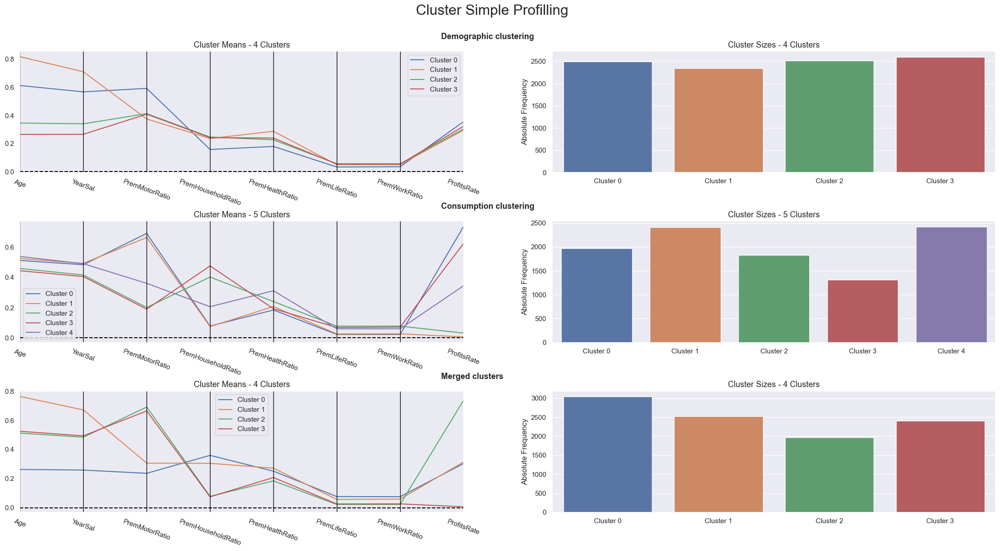

In [153]:
# Profilling each cluster (product, behavior, merged)
cluster_profiles(
    df = df[metric_features + ['demographic_labels', 'consumption_labels', 'merged_labels']], 
    label_columns = ['demographic_labels', 'consumption_labels', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Demographic clustering", "Consumption clustering", "Merged clusters"]
)

In [154]:
#Mean
df_unscaled[metric_features + non_metric_features+ ['merged_labels']].groupby('merged_labels').agg('mean')

,Age,YearSal,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,ProfitsRate,EducDeg,Children
merged_labels,,,,,,,,,,
0,34.565668,21641.870507,0.236323,0.359537,0.251060,0.076937,0.076133,0.303354,2.146478,0.858460
1,66.078899,48706.225020,0.306190,0.304854,0.271682,0.057578,0.059687,0.313642,2.428345,0.347189
2,50.260740,36435.514894,0.690973,0.078490,0.184602,0.023043,0.022874,0.736256,2.832320,0.835360
3,51.047325,37035.076234,0.664188,0.074955,0.207456,0.026346,0.027051,0.006719,2.771464,0.804645


In [155]:
#Mode
df_unscaled[metric_features + non_metric_features+ ['merged_labels']].groupby('merged_labels')\
    .agg(lambda x: x.value_counts().index[0])

,Age,YearSal,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,ProfitsRate,EducDeg,Children
merged_labels,,,,,,,,,,
0,35.0,17724.0,0.217,0.279,0.177,0.053,0.031,0.00,2,1.0
1,67.0,52864.0,0.355,0.327,0.204,0.042,0.034,0.00,3,0.0
2,48.0,36610.0,0.632,0.040,0.144,0.000,-0.000,0.76,3,1.0
3,49.0,37618.0,0.658,0.032,0.155,0.000,-0.000,0.00,3,1.0


In [156]:
#Mode
df_unscaled[metric_features + non_metric_features+ ['merged_labels']].groupby('merged_labels')\
    .agg('median')

,Age,YearSal,PremMotorRatio,PremHouseholdRatio,PremHealthRatio,PremLifeRatio,PremWorkRatio,ProfitsRate,EducDeg,Children
merged_labels,,,,,,,,,,
0,35.0,21056.0,0.2280,0.3475,0.240,0.063,0.063,0.29,2.0,1.0
1,67.0,48860.0,0.3095,0.2950,0.258,0.050,0.050,0.32,3.0,0.0
2,49.0,36057.0,0.6810,0.0810,0.177,0.017,0.018,0.74,3.0,1.0
3,50.0,36260.0,0.6550,0.0790,0.196,0.018,0.020,0.00,3.0,1.0


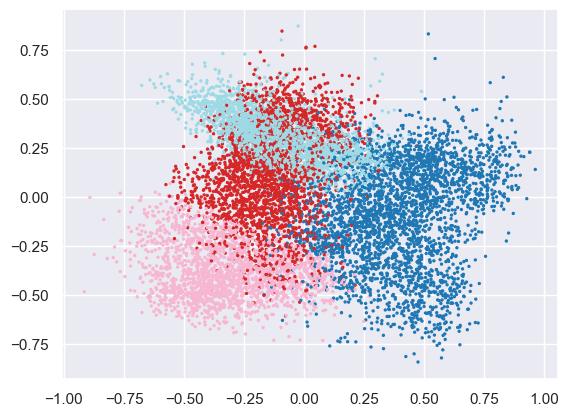

In [157]:
pca =PCA(random_state=1,n_components=2).fit_transform(df[metric_features])
pca_features=['PCA0','PCA1']
df_pca = pd.DataFrame(pca, index=df.index, columns=pca_features)

plt.scatter(df_pca.iloc[:,0],df_pca.iloc[:,1], c = df['merged_labels'], cmap='tab20',s=2)

C:\Users\Pedro\Anaconda\envs\Python_3-8\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\Pedro\Anaconda\envs\Python_3-8\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


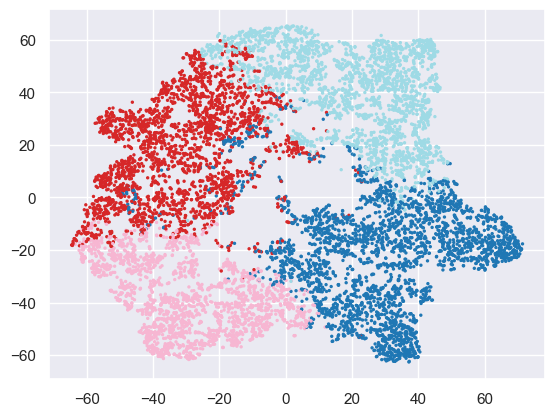

In [158]:
tsne =TSNE(random_state=1,perplexity=50).fit_transform(df[metric_features])
tsne_features=['TSNE0','TSNE1']
df_tsne = pd.DataFrame(tsne, index=df.index, columns=tsne_features)

plt.scatter(df_tsne.iloc[:,0],df_tsne.iloc[:,1], c = df['merged_labels'], cmap='tab20',s=2)

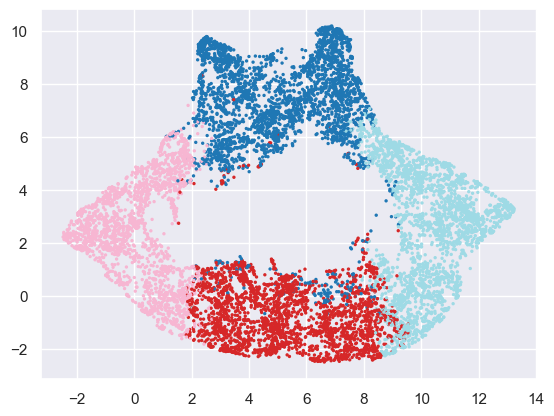

In [159]:
umap =UMAP(random_state=1).fit_transform(df[metric_features])
umap_features=['UMAP0','UMAP1']
df_umap = pd.DataFrame(umap, index=df.index, columns=umap_features)

plt.scatter(df_umap.iloc[:,0],df_umap.iloc[:,1], c = df['merged_labels'], cmap='tab20',s=2)